# Plots of the temperature contributions of individual feedbacks over time

By: Ty Janoski
Updated: 12.08.2021

## Set-up

In [15]:
# import statements:
import xarray as xr
import matplotlib.pyplot as plt
import scipy.stats as stats
import numpy as np
from dask.diagnostics import ProgressBar

%matplotlib inline
%config InlineBackend.figure_format = "jpg"

## Data analysis & plotting

In [16]:
# To convert to temperature contributions, we need the planck feedback
path = '/dx02/janoski/cesm/spat_avg_feedbacks/all/b40.1850.cam5-lens.01.'
norm = -1 * (xr.open_dataarray(path+'glb_planck.nc').mean(dim='ens') /
        xr.open_dataarray(path+'glb_dTS.nc').mean(dim='ens'))

### Global average

In [41]:
# all files have the same path
path = '/dx02/janoski/cesm/spat_avg_feedbacks/all/b40.1850.cam5-lens.01.'

# read in each dataarray, _g = global average, _a = arctic average (>70N)
AHT_g = xr.open_dataarray(path+'glb_AHT.nc')
alb_g = xr.open_dataarray(path+'glb_alb_toa.nc')
clw_g = xr.open_dataarray(path+'glb_clw_toa.nc')
# co2_g = xr.open_dataarray(path+'glb_CO2.nc')
csw_g = xr.open_dataarray(path+'glb_csw_toa.nc')
dEdt_g = xr.open_dataarray(path+'glb_dEdt.nc')
dTS_g = xr.open_dataarray(path+'glb_dTS.nc')
sfc_g = xr.open_dataarray(path+'glb_Fsfc.nc')
lap_g = xr.open_dataarray(path+'glb_lapse.nc')
plk_g = xr.open_dataarray(path+'glb_planck.nc')
qlw_g = xr.open_dataarray(path+'glb_qlw_toa.nc')
qsw_g = xr.open_dataarray(path+'glb_qsw_toa.nc')
sat_g_all = xr.open_dataarray(path+'glb_dSAT.nc')
dLHFLX_g = xr.open_dataarray(path+'glb_dLHFLX.nc')
dSHFLX_g = xr.open_dataarray(path+'glb_dSHFLX.nc')
qlw_strato_g = xr.open_dataarray(path+'glb_qlw_strato.nc')
qsw_strato_g = xr.open_dataarray(path+'glb_qsw_strato.nc')
T_strato_g = xr.open_dataarray(path+'glb_T_strato.nc')

nonrad_g = dLHFLX_g + dSHFLX_g
rad_g = sfc_g - nonrad_g

# add SW and LW components of cloud and Q feedbacks
cld_g = clw_g + csw_g
q_g = qlw_g + qsw_g
q_strato_g = qlw_strato_g + qsw_strato_g

# planck is local deviation from global avg:
plk_gprime = ((plk_g / dTS_g.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_g.mean(dim='ens')

In [42]:
AHT_gmean = AHT_g.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_g = stats.ttest_1samp(AHT_g,0,axis=0)[1]

alb_gmean = alb_g.mean(dim='ens')/norm
alb_p_g = stats.ttest_1samp(alb_g,0,axis=0)[1]

cld_gmean = cld_g.mean(dim='ens')/norm
cld_p_g = stats.ttest_1samp(cld_g,0,axis=0)[1]

dEdt_gmean = dEdt_g.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
dEdt_p_g = stats.ttest_1samp(dEdt_g,0,axis=0)[1]

sfc_gmean = sfc_g.mean(dim='ens')/norm
sfc_p_g = stats.ttest_1samp(sfc_g,0,axis=0)[1]

lap_gmean = lap_g.mean(dim='ens')/norm
lap_p_g = stats.ttest_1samp(lap_g,0,axis=0)[1]

plk_gmean = plk_gprime.mean(dim='ens')/norm
plk_p_g = stats.ttest_1samp(plk_gprime,0,axis=0)[1]

q_gmean = q_g.mean(dim='ens')/norm
q_p_g = stats.ttest_1samp(q_g,0,axis=0)[1]

nonrad_gmean = nonrad_g.mean(dim='ens')/norm
nonrad_p_g = stats.ttest_1samp(nonrad_g,0,axis=0)[1]

rad_gmean = rad_g.mean(dim='ens')/norm
rad_p_g = stats.ttest_1samp(rad_g,0,axis=0)[1]

# CO2_g = np.array(co2_g)/np.array(norm)

q_strato_gmean = q_strato_g.mean(dim='ens')/norm
q_strato_p_g = stats.ttest_1samp(q_strato_g,0,axis=0)[1]
T_strato_gmean = T_strato_g.mean(dim='ens')/norm
T_strato_p_g = stats.ttest_1samp(T_strato_g,0,axis=0)[1]

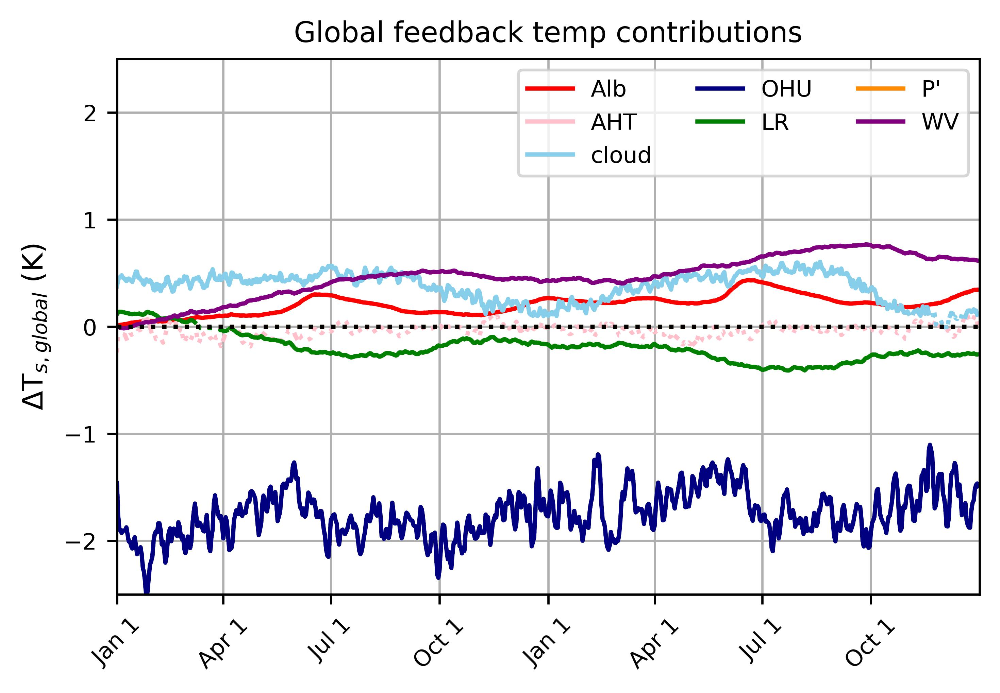

In [8]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(5,3.5),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_gmean, color='red',linestyle='dotted')
ax.plot(xs, alb_gmean.where(alb_p_g<0.05), color='red',label='Alb')
ax.plot(xs, AHT_gmean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_gmean.where(AHT_p_g<0.05), color='pink',label='AHT')
ax.plot(xs, cld_gmean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_gmean.where(cld_p_g<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_gmean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_gmean.where(dEdt_p_g<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_gmean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_gmean.where(sfc_p_g<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_gmean, color='green',linestyle='dotted')
ax.plot(xs, lap_gmean.where(lap_p_g<0.05), color='green',label='LR')
ax.plot(xs, plk_gmean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_gmean.where(plk_p_g<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_gmean, color='purple',linestyle='dotted')
ax.plot(xs, q_gmean.where(q_p_g<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_g,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])
ax.set_ylim([-2.5,2.5])
ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Global feedback temp contributions',fontsize=10)
plt.tight_layout()
plt.show()

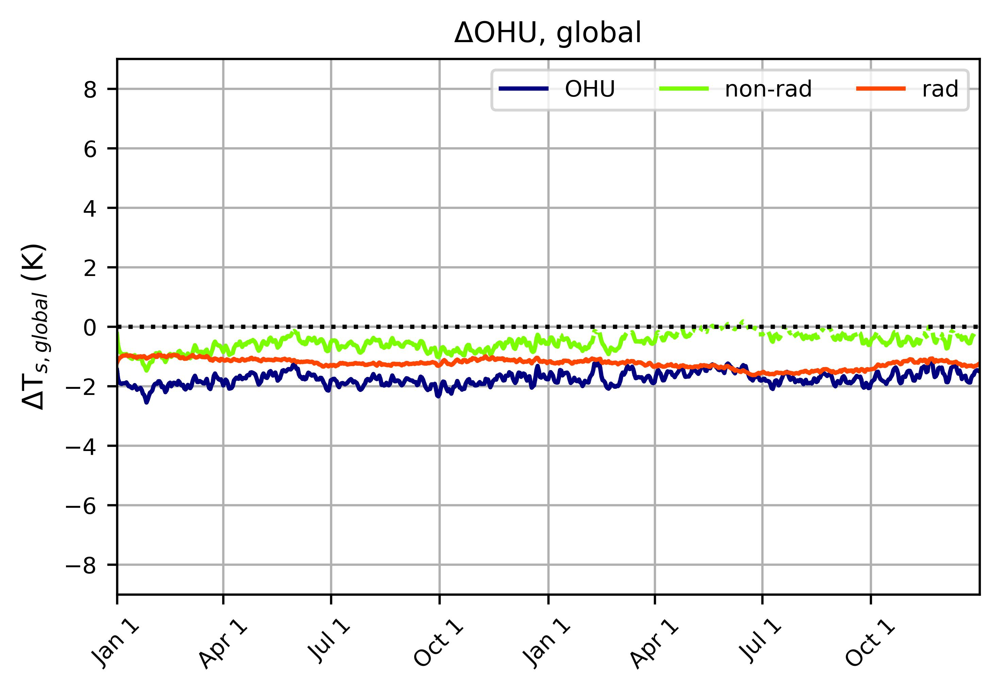

In [9]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(5,3.5),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_gmean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_gmean.where(sfc_p_g<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_gmean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_gmean.where(nonrad_p_g<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_gmean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_gmean.where(rad_p_g<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, global',fontsize=10)
plt.tight_layout()
plt.show()

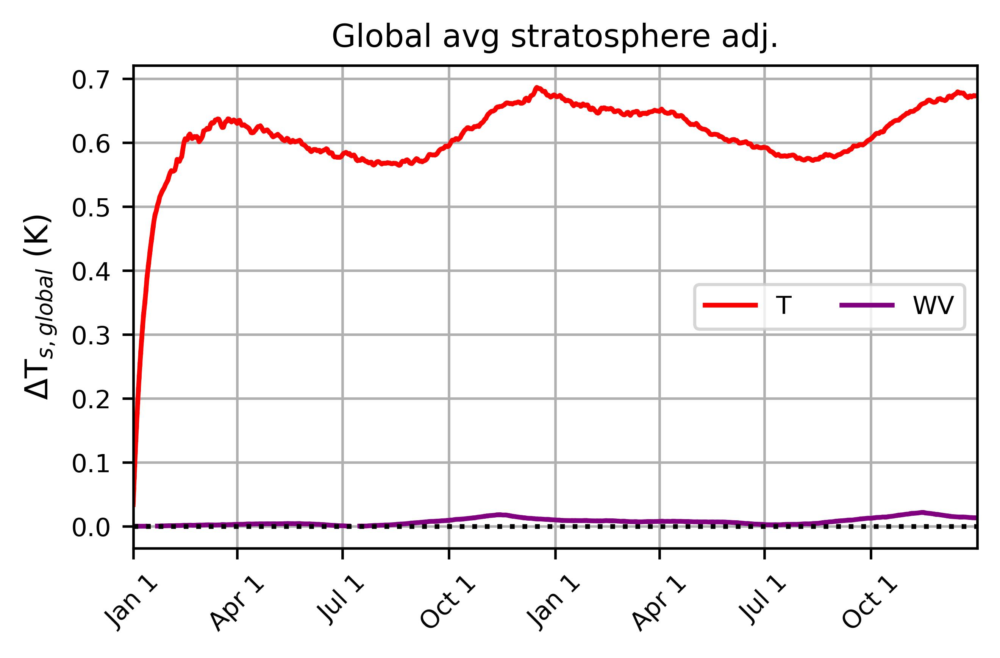

In [43]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_gmean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_gmean.where(T_strato_p_g<0.05),color='red',label='T')
ax.plot(xs, q_strato_gmean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_gmean.where(q_strato_p_g<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Global avg stratosphere adj.',fontsize=10)
plt.tight_layout()
plt.show()

### Arctic average

In [10]:
# read in each dataarray, _g = global average, _a = arctic average (>70N)
AHT_a = xr.open_dataarray(path+'arc_AHT.nc')
alb_a = xr.open_dataarray(path+'arc_alb_toa.nc')
clw_a = xr.open_dataarray(path+'arc_clw_toa.nc')
# co2_a = xr.open_dataarray(path+'arc_CO2.nc')
csw_a = xr.open_dataarray(path+'arc_csw_toa.nc')
dEdt_a = xr.open_dataarray(path+'arc_dEdt.nc')
dTS_a = xr.open_dataarray(path+'arc_dTS.nc')
sfc_a = xr.open_dataarray(path+'arc_Fsfc.nc')
lap_a = xr.open_dataarray(path+'arc_lapse.nc')
plk_a = xr.open_dataarray(path+'arc_planck.nc')
qlw_a = xr.open_dataarray(path+'arc_qlw_toa.nc')
qsw_a = xr.open_dataarray(path+'arc_qsw_toa.nc')
sat_a_all = xr.open_dataarray(path+'arc_dSAT.nc')
dLHFLX_a = xr.open_dataarray(path+'arc_dLHFLX.nc')
dSHFLX_a = xr.open_dataarray(path+'arc_dSHFLX.nc')
Sconv_a = xr.open_dataarray(path+'arc_Sconv.nc')
Wconv_a = xr.open_dataarray(path+'arc_Wconv.nc')
nonrad_a = dLHFLX_a + dSHFLX_a
rad_a = sfc_a - nonrad_a

qlw_strato_a = xr.open_dataarray(path+'arc_qlw_strato.nc')
qsw_strato_a = xr.open_dataarray(path+'arc_qsw_strato.nc')
T_strato_a = xr.open_dataarray(path+'arc_T_strato.nc')

# add SW and LW components of cloud and Q feedbacks
q_a = qlw_a + qsw_a
q_strato_a = qlw_strato_a + qsw_strato_a


# planck is local deviation from global avg:
plk_aprime = ((plk_a / dTS_a.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_a.mean(dim='ens')

# add SW and LW components of cloud and Q feedbacks
cld_a = clw_a + csw_a
q_a = qlw_a + qsw_a

In [29]:
AHT_amean = AHT_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_a = stats.ttest_1samp(AHT_a,0,axis=0)[1]

alb_amean = alb_a.mean(dim='ens')/norm
alb_p_a = stats.ttest_1samp(alb_a,0,axis=0)[1]

cld_amean = cld_a.mean(dim='ens')/norm
cld_p_a = stats.ttest_1samp(cld_a,0,axis=0)[1]

dEdt_amean = dEdt_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
dEdt_p_a = stats.ttest_1samp(dEdt_a,0,axis=0)[1]

sfc_amean = sfc_a.mean(dim='ens')/norm
sfc_p_a = stats.ttest_1samp(sfc_a,0,axis=0)[1]

lap_amean = lap_a.mean(dim='ens')/norm
lap_p_a = stats.ttest_1samp(lap_a,0,axis=0)[1]

plk_amean = plk_aprime.mean(dim='ens')/norm
plk_p_a = stats.ttest_1samp(plk_aprime,0,axis=0)[1]

q_amean = q_a.mean(dim='ens')/norm
q_p_a = stats.ttest_1samp(q_a,0,axis=0)[1]

nonrad_amean = nonrad_a.mean(dim='ens')/norm
nonrad_p_a = stats.ttest_1samp(nonrad_a,0,axis=0)[1]

rad_amean = rad_a.mean(dim='ens')/norm
rad_p_a = stats.ttest_1samp(rad_a,0,axis=0)[1]

Sconv_amean = Sconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Sconv_p_a = stats.ttest_1samp(Sconv_a,0,axis=0)[1]

Wconv_amean = Wconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Wconv_p_a = stats.ttest_1samp(Wconv_a,0,axis=0)[1]

# CO2_a = np.array(co2_a)/np.array(norm)

q_strato_amean = q_strato_a.mean(dim='ens')/norm
q_strato_p_a = stats.ttest_1samp(q_strato_a,0,axis=0)[1]
T_strato_amean = T_strato_a.mean(dim='ens')/norm
T_strato_p_a = stats.ttest_1samp(T_strato_a,0,axis=0)[1]

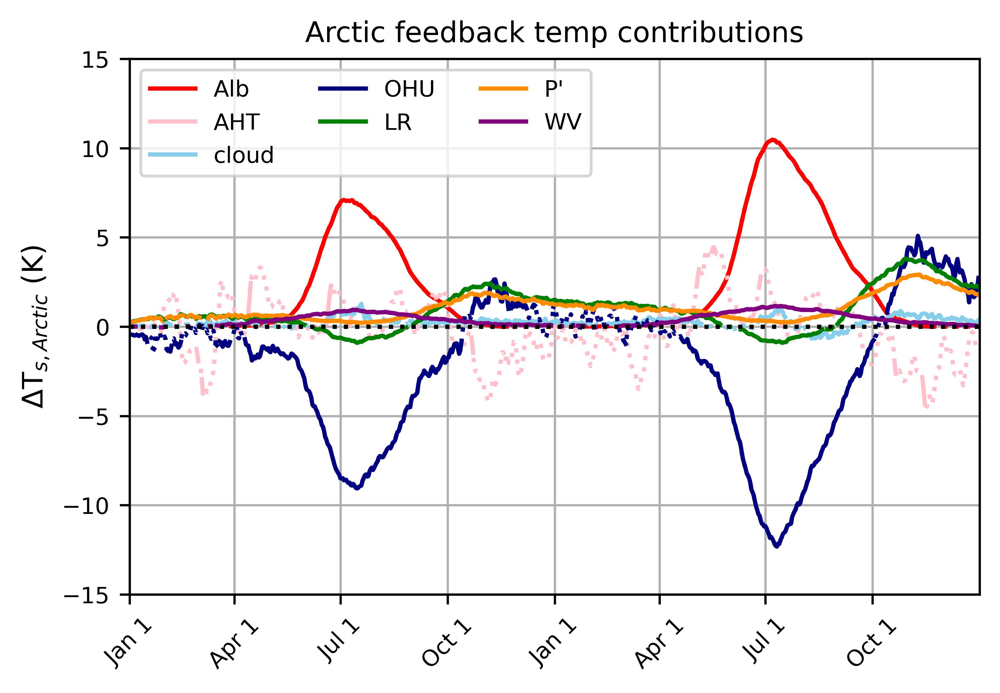

In [30]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(5,3.5),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_amean, color='red',linestyle='dotted')
ax.plot(xs, alb_amean.where(alb_p_a<0.05), color='red',label='Alb')
ax.plot(xs, AHT_amean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_amean.where(AHT_p_a<0.05), color='pink',label='AHT')
ax.plot(xs, cld_amean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_amean.where(cld_p_a<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_amean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_amean.where(dEdt_p_a<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_amean, color='green',linestyle='dotted')
ax.plot(xs, lap_amean.where(lap_p_a<0.05), color='green',label='LR')
ax.plot(xs, plk_amean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_amean.where(plk_p_a<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_amean, color='purple',linestyle='dotted')
ax.plot(xs, q_amean.where(q_p_a<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_a,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])
ax.set_ylim([-15,15])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic feedback temp contributions',fontsize=10)
plt.tight_layout()
plt.show()

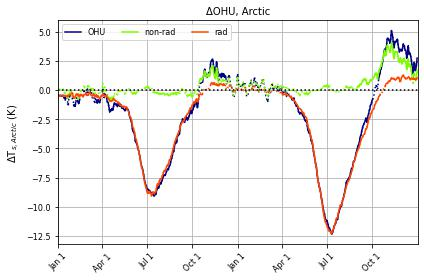

In [31]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(6,4))

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_amean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_amean.where(nonrad_p_a<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_amean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_amean.where(rad_p_a<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, Arctic',fontsize=10)
plt.tight_layout()
plt.show()

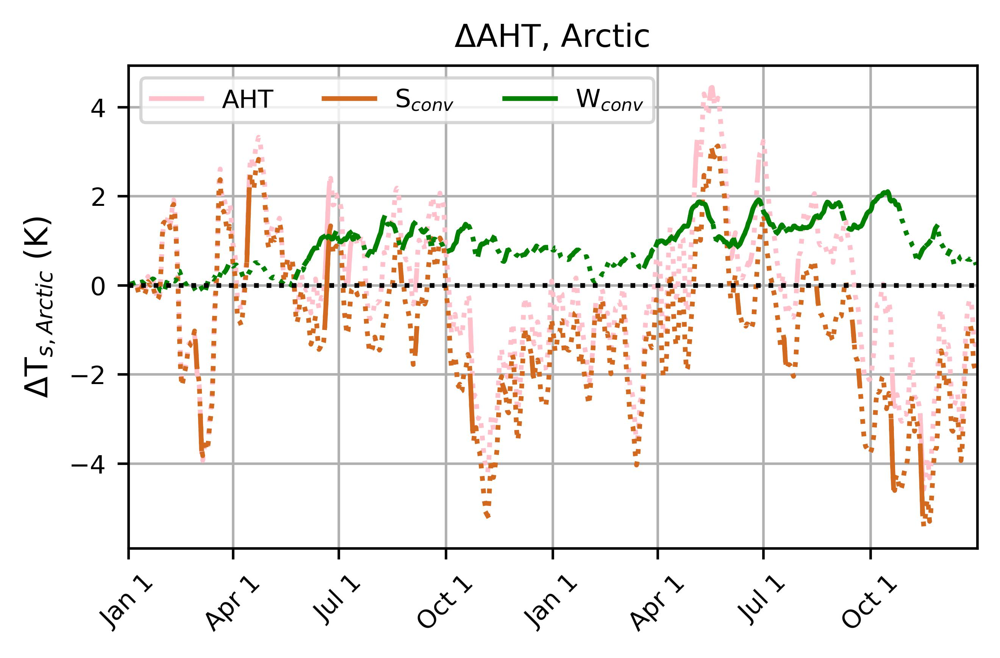

In [32]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, AHT_amean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_amean.where(AHT_p_a<0.05), color='pink',label='AHT')
ax.plot(xs, Sconv_amean, color='chocolate',linestyle='dotted')
ax.plot(xs, Sconv_amean.where(Sconv_p_a<0.05), color='chocolate',label=r'S$_{conv}$')
ax.plot(xs, Wconv_amean, color='green',linestyle='dotted')
ax.plot(xs, Wconv_amean.where(Wconv_p_a<0.05), color='green',label=r'W$_{conv}$')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔAHT, Arctic',fontsize=10)
plt.tight_layout()
plt.show()

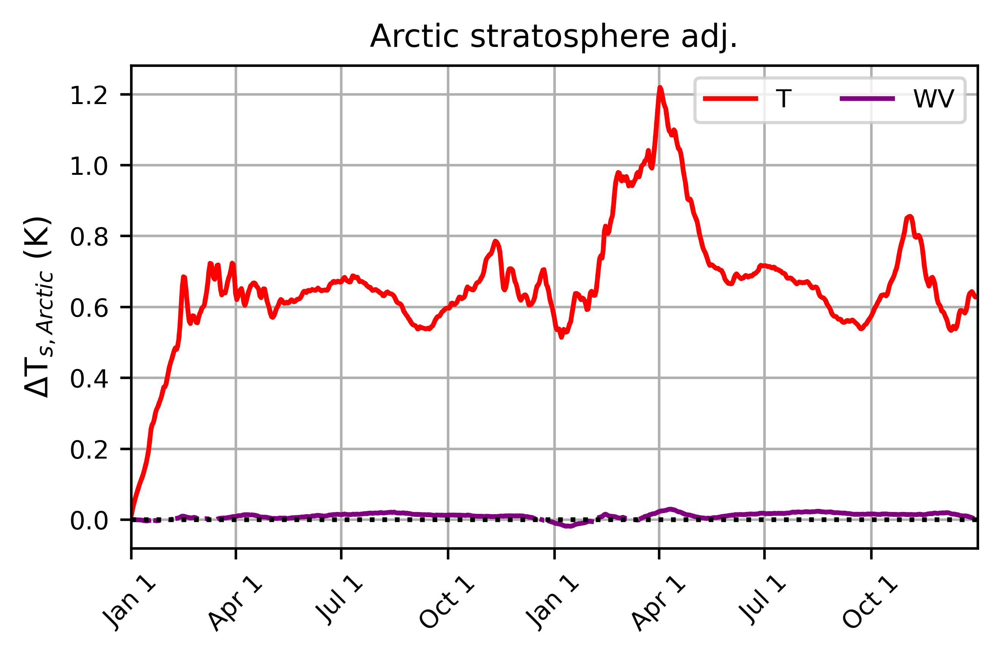

In [40]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_amean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_amean.where(T_strato_p_a<0.05),color='red',label='T')
ax.plot(xs, q_strato_amean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_amean.where(q_strato_p_a<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic stratosphere adj.',fontsize=10)
plt.tight_layout()
plt.show()

### Antarctic Avg

In [40]:
# read in each dataarray, _g = global average, _a = arctic average (>70N)
AHT_ant = xr.open_dataarray(path+'ant_AHT.nc')
alb_ant = xr.open_dataarray(path+'ant_alb_toa.nc')
clw_ant = xr.open_dataarray(path+'ant_clw_toa.nc')
co2_ant = xr.open_dataarray(path+'ant_CO2.nc')
csw_ant = xr.open_dataarray(path+'ant_csw_toa.nc')
dTS_ant = xr.open_dataarray(path+'ant_dTS.nc')
sfc_ant = xr.open_dataarray(path+'ant_Fsfc.nc')
lap_ant = xr.open_dataarray(path+'ant_lapse.nc')
plk_ant = xr.open_dataarray(path+'ant_planck.nc')
qlw_ant = xr.open_dataarray(path+'ant_qlw_toa.nc')
qsw_ant = xr.open_dataarray(path+'ant_qsw_toa.nc')
sat_ant_all = xr.open_dataarray(path+'ant_dSAT.nc')
dLHFLX_ant = xr.open_dataarray(path+'ant_dLHFLX.nc')
dSHFLX_ant = xr.open_dataarray(path+'ant_dSHFLX.nc')
Sconv_ant = xr.open_dataarray(path+'ant_Sconv.nc')
Wconv_ant = xr.open_dataarray(path+'ant_Wconv.nc')
nonrad_ant = dLHFLX_ant + dSHFLX_ant
rad_ant = sfc_ant - nonrad_ant


qlw_strato_ant = xr.open_dataarray(path+'ant_qlw_strato.nc')
qsw_strato_ant = xr.open_dataarray(path+'ant_qsw_strato.nc')
T_strato_ant = xr.open_dataarray(path+'ant_T_strato.nc')

# add SW and LW components of cloud and Q feedbacks
q_ant = qlw_ant + qsw_ant
q_strato_ant = qlw_strato_ant + qsw_strato_ant

# planck is local deviation from global avg:
plk_antprime = ((plk_ant / dTS_ant.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_ant.mean(dim='ens')

# add SW and LW components of cloud and Q feedbacks
cld_ant = clw_ant + csw_ant
q_ant = qlw_ant + qsw_ant

In [53]:
AHT_antmean = AHT_ant.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_ant = stats.ttest_1samp(AHT_ant,0,axis=0)[1]

alb_antmean = alb_ant.mean(dim='ens')/norm
alb_p_ant = stats.ttest_1samp(alb_ant,0,axis=0)[1]

cld_antmean = cld_ant.mean(dim='ens')/norm
cld_p_ant = stats.ttest_1samp(cld_ant,0,axis=0)[1]

sfc_antmean = sfc_ant.mean(dim='ens')/norm
sfc_p_ant = stats.ttest_1samp(sfc_ant,0,axis=0)[1]

lap_antmean = lap_ant.mean(dim='ens')/norm
lap_p_ant = stats.ttest_1samp(lap_ant,0,axis=0)[1]

plk_antmean = plk_antprime.mean(dim='ens')/norm
plk_p_ant = stats.ttest_1samp(plk_antprime,0,axis=0)[1]

q_antmean = q_ant.mean(dim='ens')/norm
q_p_ant = stats.ttest_1samp(q_ant,0,axis=0)[1]

nonrad_antmean = nonrad_ant.mean(dim='ens')/norm
nonrad_p_ant = stats.ttest_1samp(nonrad_ant,0,axis=0)[1]

rad_antmean = rad_ant.mean(dim='ens')/norm
rad_p_ant = stats.ttest_1samp(rad_ant,0,axis=0)[1]

Sconv_antmean = Sconv_ant.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Sconv_p_ant = stats.ttest_1samp(Sconv_ant,0,axis=0)[1]

Wconv_antmean = Wconv_ant.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Wconv_p_ant = stats.ttest_1samp(Wconv_ant,0,axis=0)[1]

CO2_ant = np.array(co2_ant)/np.array(norm)

q_strato_antmean = q_strato_ant.mean(dim='ens')/norm
T_strato_antmean = T_strato_ant.mean(dim='ens')/norm


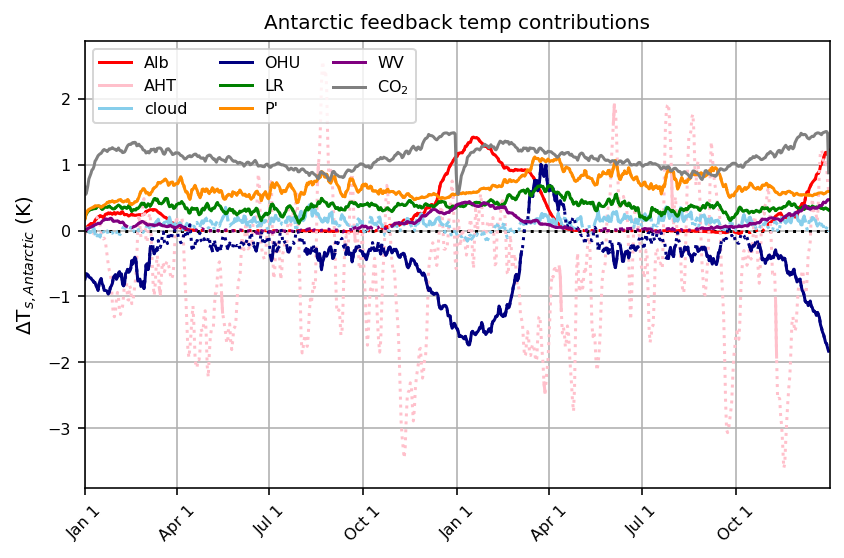

In [54]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(6,4))

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_antmean, color='red',linestyle='dotted')
ax.plot(xs, alb_antmean.where(alb_p_ant<0.05), color='red',label='Alb')
ax.plot(xs, AHT_antmean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_antmean.where(AHT_p_ant<0.05), color='pink',label='AHT')
ax.plot(xs, cld_antmean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_antmean.where(cld_p_ant<0.05), color='skyblue',label='cloud')
ax.plot(xs, sfc_antmean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_antmean.where(sfc_p_ant<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_antmean, color='green',linestyle='dotted')
ax.plot(xs, lap_antmean.where(lap_p_ant<0.05), color='green',label='LR')
ax.plot(xs, plk_antmean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_antmean.where(plk_p_ant<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_antmean, color='purple',linestyle='dotted')
ax.plot(xs, q_antmean.where(q_p_ant<0.05), color='purple',label=r'WV')
ax.plot(xs, CO2_ant,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Antarctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Antarctic feedback temp contributions',fontsize=10)
plt.tight_layout()
plt.show()

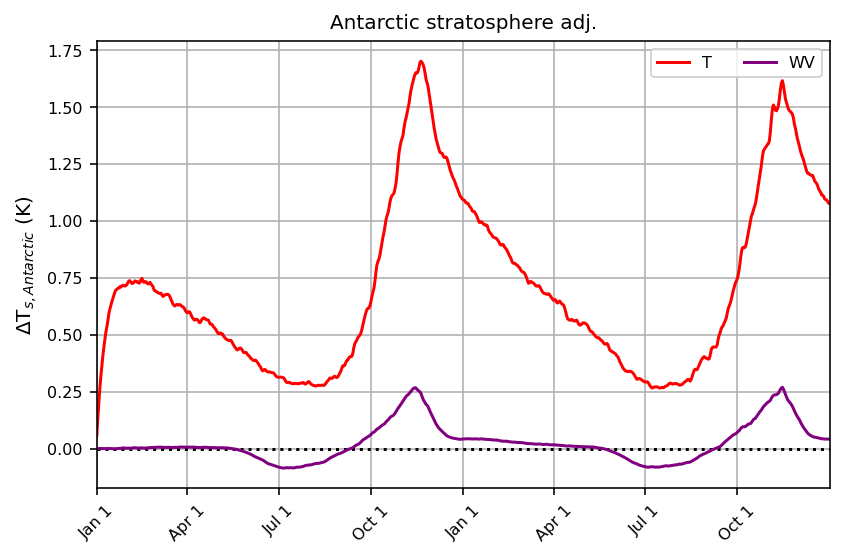

In [56]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(6,4))

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_antmean, color='red',label='T')
ax.plot(xs, q_strato_antmean, color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Antarctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Antarctic stratosphere adj.',fontsize=10)
plt.tight_layout()
plt.show()

### Arctic - global

In [24]:
AHT_diff = (AHT_a - AHT_g)/norm
AHT_mean = AHT_diff.mean(dim='ens').rolling(time=15,min_periods=1).mean()
AHT_p = stats.ttest_1samp(AHT_diff,0,axis=0)[1]

alb_diff = (alb_a - alb_g)/norm
alb_mean = alb_diff.mean(dim='ens')
alb_p = stats.ttest_1samp(alb_diff,0,axis=0)[1]

cld_diff = (cld_a - cld_g)/norm
cld_mean = cld_diff.mean(dim='ens')
cld_p = stats.ttest_1samp(cld_diff,0,axis=0)[1]

dEdt_diff = (dEdt_a - dEdt_g)/norm
dEdt_mean = dEdt_diff.mean(dim='ens').rolling(time=15,min_periods=1).mean()
dEdt_p = stats.ttest_1samp(dEdt_diff,0,axis=0)[1]

sfc_diff = (sfc_a - sfc_g)/norm
sfc_mean = sfc_diff.mean(dim='ens')
sfc_p = stats.ttest_1samp(sfc_diff,0,axis=0)[1]

lap_diff = (lap_a - lap_g)/norm
lap_mean = lap_diff.mean(dim='ens')
lap_p = stats.ttest_1samp(lap_diff,0,axis=0)[1]

plk_diff = (plk_aprime - plk_gprime)/norm
plk_mean = plk_diff.mean(dim='ens')
plk_p = stats.ttest_1samp(plk_diff,0,axis=0)[1]

q_diff = (q_a - q_g)/norm
q_mean = q_diff.mean(dim='ens')
q_p = stats.ttest_1samp(q_diff,0,axis=0)[1]

nonrad_diff = (nonrad_a - nonrad_g)/norm
nonrad_mean = nonrad_diff.mean(dim='ens')
nonrad_p = stats.ttest_1samp(nonrad_diff,0,axis=0)[1]

rad_diff = (rad_a - rad_g)/norm
rad_mean = rad_diff.mean(dim='ens')
rad_p = stats.ttest_1samp(rad_diff,0,axis=0)[1]

# CO2_diff = np.array(co2_a - co2_g)/np.array(norm)

sat_diff_all = (sat_a_all - sat_g_all)
sat_mean_all = sat_diff_all.mean(dim='ens')
sat_p_all = stats.ttest_1samp(sat_diff_all,0,axis=0)[1]

q_strato_diff = (q_strato_a - q_strato_g)/norm
q_strato_mean = q_strato_diff.mean(dim='ens')
q_strato_p = stats.ttest_1samp(q_strato_diff,0,axis=0)[1]

T_strato_diff = (T_strato_a - T_strato_g)/norm
T_strato_mean = T_strato_diff.mean(dim='ens')
T_strato_p = stats.ttest_1samp(T_strato_diff,0,axis=0)[1]

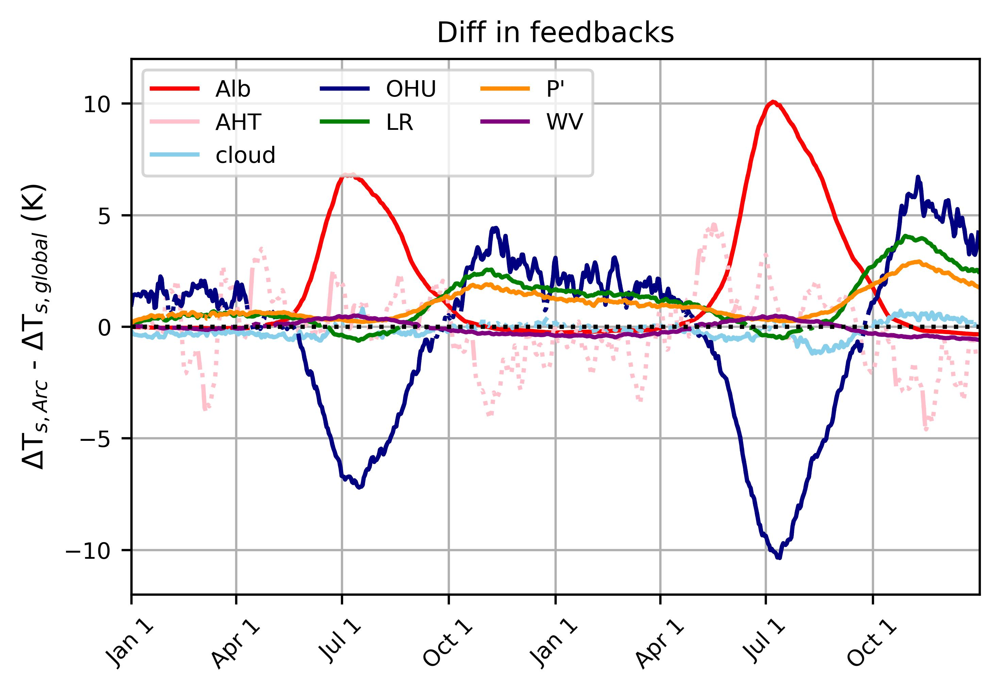

In [19]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(5,3.5),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_mean, color='red',linestyle='dotted')
ax.plot(xs, alb_mean.where(alb_p<0.05), color='red',label='Alb')
ax.plot(xs, AHT_mean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_mean.where(AHT_p<0.05), color='pink',label='AHT')
ax.plot(xs, cld_mean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_mean.where(cld_p<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_mean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_mean.where(dEdt_p<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_mean, color='green',linestyle='dotted')
ax.plot(xs, lap_mean.where(lap_p<0.05), color='green',label='LR')
ax.plot(xs, plk_mean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_mean.where(plk_p<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_mean.where(q_p<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_diff,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])
ax.set_ylim([-12,12])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arc}$ - ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Diff in feedbacks',fontsize=10)
plt.tight_layout()
plt.show()

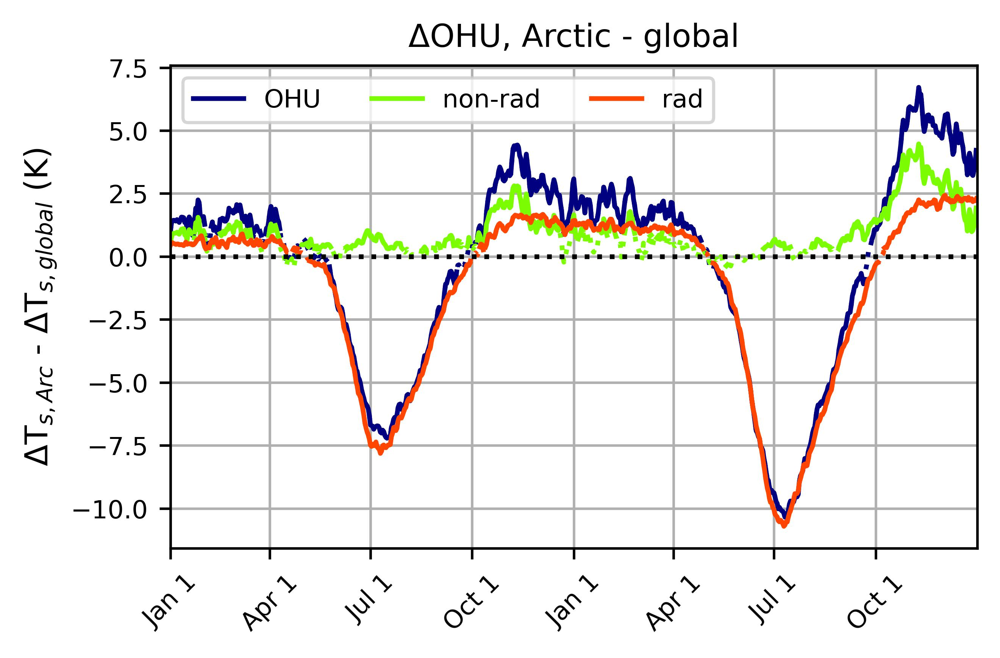

In [21]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_mean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_mean.where(nonrad_p<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_mean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_mean.where(rad_p<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arc}$ - ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, Arctic - global',fontsize=10)
plt.tight_layout()
plt.show()

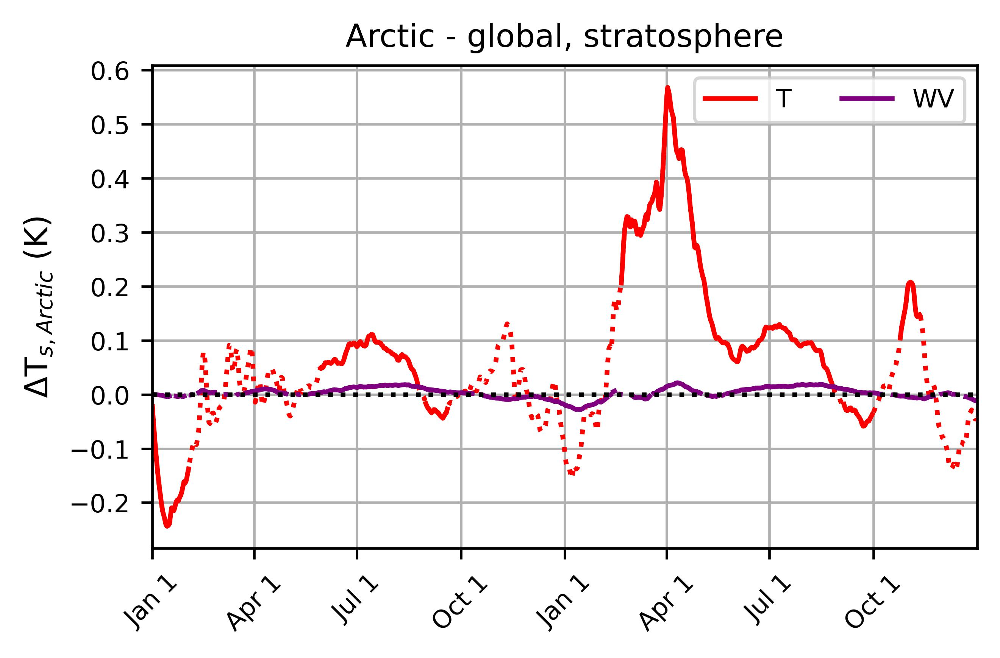

In [28]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_mean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_mean.where(T_strato_p < 0.05), color='red',label='T')
ax.plot(xs, q_strato_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_mean.where(q_strato_p<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic - global, stratosphere',fontsize=10)
plt.tight_layout()
plt.show()

### Antarctic - global

In [36]:
AHT_diff = (AHT_ant - AHT_g)/norm
AHT_mean = AHT_diff.mean(dim='ens').rolling(time=15,min_periods=1).mean()
AHT_p = stats.ttest_1samp(AHT_diff,0,axis=0)[1]

alb_diff = (alb_ant - alb_g)/norm
alb_mean = alb_diff.mean(dim='ens')
alb_p = stats.ttest_1samp(alb_diff,0,axis=0)[1]

cld_diff = (cld_ant - cld_g)/norm
cld_mean = cld_diff.mean(dim='ens')
cld_p = stats.ttest_1samp(cld_diff,0,axis=0)[1]

sfc_diff = (sfc_ant - sfc_g)/norm
sfc_mean = sfc_diff.mean(dim='ens')
sfc_p = stats.ttest_1samp(sfc_diff,0,axis=0)[1]

lap_diff = (lap_ant - lap_g)/norm
lap_mean = lap_diff.mean(dim='ens')
lap_p = stats.ttest_1samp(lap_diff,0,axis=0)[1]

plk_diff = (plk_antprime - plk_gprime)/norm
plk_mean = plk_diff.mean(dim='ens')
plk_p = stats.ttest_1samp(plk_diff,0,axis=0)[1]

q_diff = (q_ant - q_g)/norm
q_mean = q_diff.mean(dim='ens')
q_p = stats.ttest_1samp(q_diff,0,axis=0)[1]

nonrad_diff = (nonrad_ant - nonrad_g)/norm
nonrad_mean = nonrad_diff.mean(dim='ens')
nonrad_p = stats.ttest_1samp(nonrad_diff,0,axis=0)[1]

rad_diff = (rad_ant - rad_g)/norm
rad_mean = rad_diff.mean(dim='ens')
rad_p = stats.ttest_1samp(rad_diff,0,axis=0)[1]

CO2_diff = np.array(co2_ant - co2_g)/np.array(norm)

sat_diff_all = (sat_ant_all - sat_g_all)
sat_mean_all = sat_diff_all.mean(dim='ens')
sat_p_all = stats.ttest_1samp(sat_diff_all,0,axis=0)[1]

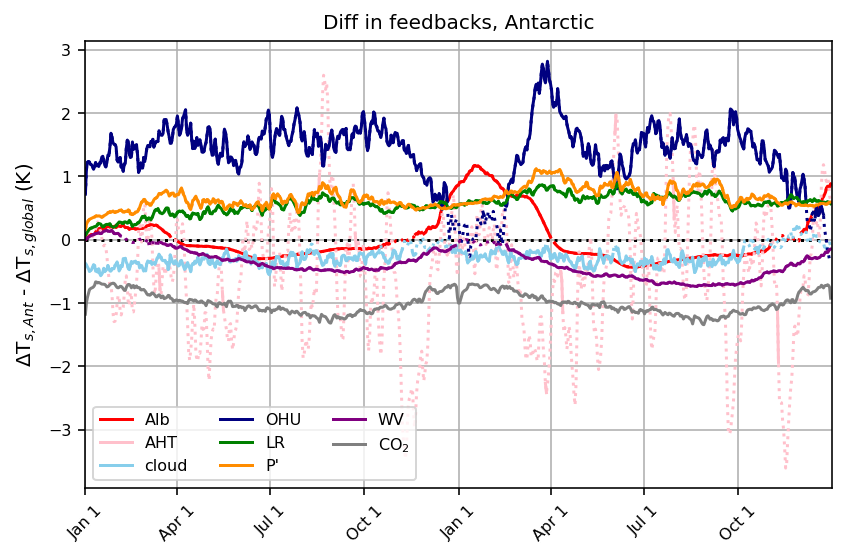

In [37]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(6,4))

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_mean, color='red',linestyle='dotted')
ax.plot(xs, alb_mean.where(alb_p<0.05), color='red',label='Alb')
ax.plot(xs, AHT_mean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_mean.where(AHT_p<0.05), color='pink',label='AHT')
ax.plot(xs, cld_mean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_mean.where(cld_p<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_mean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_mean.where(dEdt_p<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_mean, color='green',linestyle='dotted')
ax.plot(xs, lap_mean.where(lap_p<0.05), color='green',label='LR')
ax.plot(xs, plk_mean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_mean.where(plk_p<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_mean.where(q_p<0.05), color='purple',label=r'WV')
ax.plot(xs, CO2_diff,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Ant}$ - ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Diff in feedbacks, Antarctic',fontsize=10)
plt.tight_layout()
plt.show()

## July Initializations

In [44]:
# To convert to temperature contributions, we need the planck feedback
path = '/dx02/janoski/cesm/spat_avg_feedbacks/all/b40.1850.cam5-lens.07.'
norm = -1 * (xr.open_dataarray(path+'glb_planck.nc').mean(dim='ens') /
        xr.open_dataarray(path+'glb_dTS.nc').mean(dim='ens'))

### Global average

In [45]:
# all files have the same path
path = '/dx02/janoski/cesm/spat_avg_feedbacks/all/b40.1850.cam5-lens.07.'

# read in each dataarray, _g = global average, _a = arctic average (>70N)
AHT_g = xr.open_dataarray(path+'glb_AHT.nc')
alb_g = xr.open_dataarray(path+'glb_alb_toa.nc')
clw_g = xr.open_dataarray(path+'glb_clw_toa.nc')
# co2_g = xr.open_dataarray(path+'glb_CO2.nc')
csw_g = xr.open_dataarray(path+'glb_csw_toa.nc')
dTS_g = xr.open_dataarray(path+'glb_dTS.nc')
sfc_g = xr.open_dataarray(path+'glb_Fsfc.nc')
lap_g = xr.open_dataarray(path+'glb_lapse.nc')
plk_g = xr.open_dataarray(path+'glb_planck.nc')
qlw_g = xr.open_dataarray(path+'glb_qlw_toa.nc')
qsw_g = xr.open_dataarray(path+'glb_qsw_toa.nc')
sat_g_all = xr.open_dataarray(path+'glb_dSAT.nc')
dLHFLX_g = xr.open_dataarray(path+'glb_dLHFLX.nc')
dSHFLX_g = xr.open_dataarray(path+'glb_dSHFLX.nc')
qlw_strato_g = xr.open_dataarray(path+'glb_qlw_strato.nc')
qsw_strato_g = xr.open_dataarray(path+'glb_qsw_strato.nc')
T_strato_g = xr.open_dataarray(path+'glb_T_strato.nc')

nonrad_g = dLHFLX_g + dSHFLX_g
rad_g = sfc_g - nonrad_g

# add SW and LW components of cloud and Q feedbacks
cld_g = clw_g + csw_g
q_g = qlw_g + qsw_g
q_strato_g = qlw_strato_g + qsw_strato_g

# planck is local deviation from global avg:
plk_gprime = ((plk_g / dTS_g.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_g.mean(dim='ens')

In [46]:
AHT_gmean = AHT_g.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_g = stats.ttest_1samp(AHT_g,0,axis=0)[1]

alb_gmean = alb_g.mean(dim='ens')/norm
alb_p_g = stats.ttest_1samp(alb_g,0,axis=0)[1]

cld_gmean = cld_g.mean(dim='ens')/norm
cld_p_g = stats.ttest_1samp(cld_g,0,axis=0)[1]

dEdt_gmean = dEdt_g.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
dEdt_p_g = stats.ttest_1samp(dEdt_g,0,axis=0)[1]

sfc_gmean = sfc_g.mean(dim='ens')/norm
sfc_p_g = stats.ttest_1samp(sfc_g,0,axis=0)[1]

lap_gmean = lap_g.mean(dim='ens')/norm
lap_p_g = stats.ttest_1samp(lap_g,0,axis=0)[1]

plk_gmean = plk_gprime.mean(dim='ens')/norm
plk_p_g = stats.ttest_1samp(plk_gprime,0,axis=0)[1]

q_gmean = q_g.mean(dim='ens')/norm
q_p_g = stats.ttest_1samp(q_g,0,axis=0)[1]

nonrad_gmean = nonrad_g.mean(dim='ens')/norm
nonrad_p_g = stats.ttest_1samp(nonrad_g,0,axis=0)[1]

rad_gmean = rad_g.mean(dim='ens')/norm
rad_p_g = stats.ttest_1samp(rad_g,0,axis=0)[1]

# CO2_g = np.array(co2_g)/np.array(norm)

q_strato_gmean = q_strato_g.mean(dim='ens')/norm
T_strato_gmean = T_strato_g.mean(dim='ens')/norm

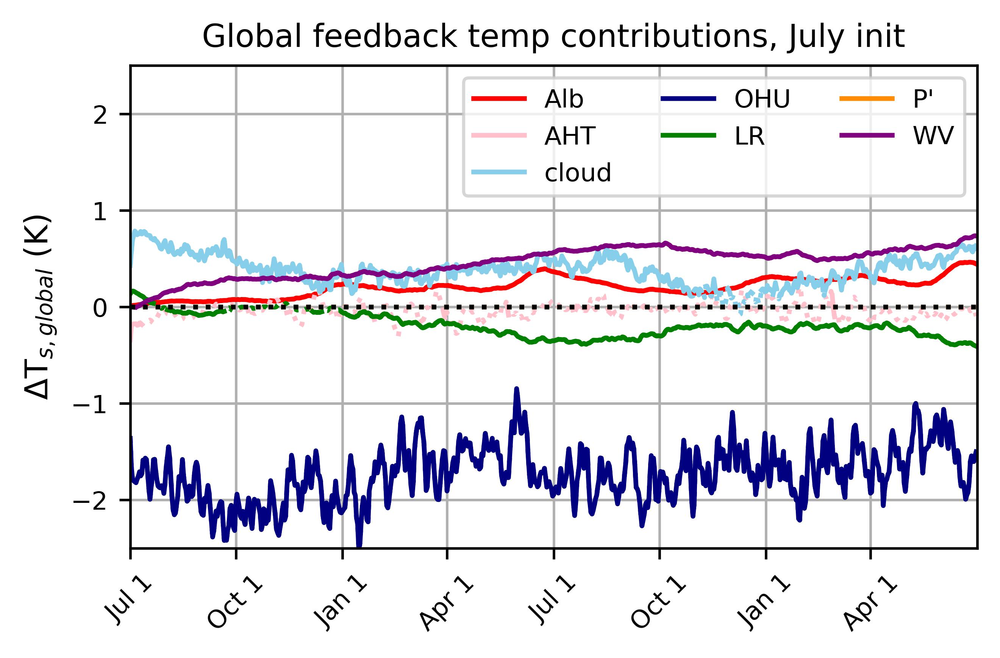

In [50]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,92,184,274])
x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jul 1','Oct 1','Jan 1','Apr 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_gmean, color='red',linestyle='dotted')
ax.plot(xs, alb_gmean.where(alb_p_g<0.05), color='red',label='Alb')
ax.plot(xs, AHT_gmean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_gmean.where(AHT_p_g<0.05), color='pink',label='AHT')
ax.plot(xs, cld_gmean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_gmean.where(cld_p_g<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_gmean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_gmean.where(dEdt_p_g<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_gmean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_gmean.where(sfc_p_g<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_gmean, color='green',linestyle='dotted')
ax.plot(xs, lap_gmean.where(lap_p_g<0.05), color='green',label='LR')
ax.plot(xs, plk_gmean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_gmean.where(plk_p_g<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_gmean, color='purple',linestyle='dotted')
ax.plot(xs, q_gmean.where(q_p_g<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_g,color='gray',label='CO$_2$')
ax.set_xlim([1,731])
ax.set_ylim([-2.5,2.5])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Global feedback temp contributions, July init',fontsize=10)
plt.tight_layout()
plt.show()

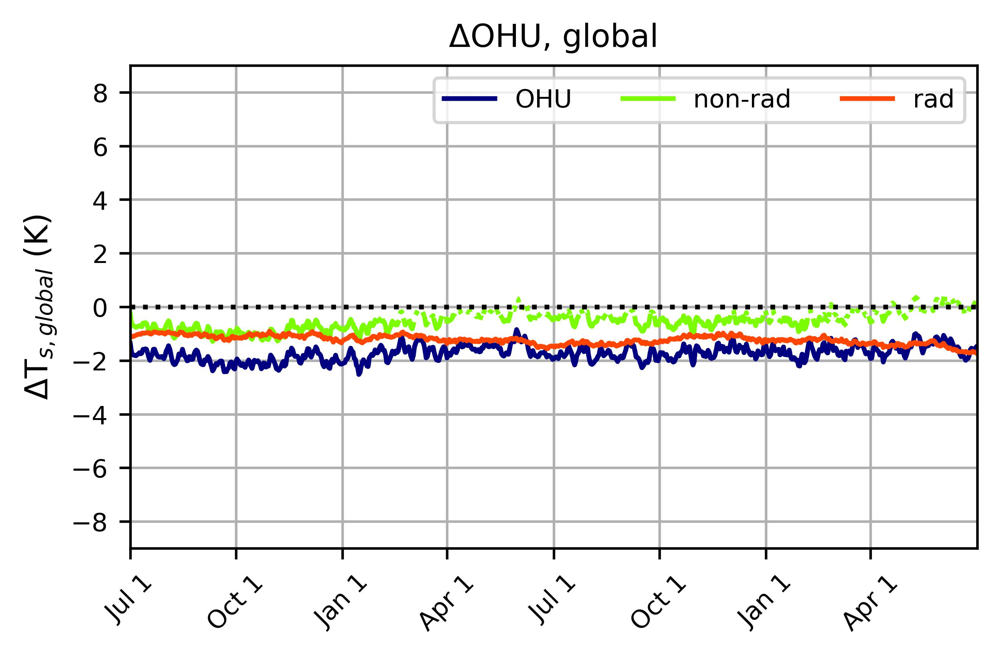

In [51]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,92,184,274])
x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jul 1','Oct 1','Jan 1','Apr 1'],
                 (2))


# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_gmean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_gmean.where(sfc_p_g<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_gmean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_gmean.where(nonrad_p_g<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_gmean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_gmean.where(rad_p_g<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, global',fontsize=10)
plt.tight_layout()
plt.show()

### Arctic Average

In [52]:
# read in each dataarray, _g = global average, _a = arctic average (>70N)
AHT_a = xr.open_dataarray(path+'arc_AHT.nc')
alb_a = xr.open_dataarray(path+'arc_alb_toa.nc')
clw_a = xr.open_dataarray(path+'arc_clw_toa.nc')
# co2_a = xr.open_dataarray(path+'arc_CO2.nc')
csw_a = xr.open_dataarray(path+'arc_csw_toa.nc')
dTS_a = xr.open_dataarray(path+'arc_dTS.nc')
sfc_a = xr.open_dataarray(path+'arc_Fsfc.nc')
lap_a = xr.open_dataarray(path+'arc_lapse.nc')
plk_a = xr.open_dataarray(path+'arc_planck.nc')
qlw_a = xr.open_dataarray(path+'arc_qlw_toa.nc')
qsw_a = xr.open_dataarray(path+'arc_qsw_toa.nc')
sat_a_all = xr.open_dataarray(path+'arc_dSAT.nc')
dLHFLX_a = xr.open_dataarray(path+'arc_dLHFLX.nc')
dSHFLX_a = xr.open_dataarray(path+'arc_dSHFLX.nc')
Sconv_a = xr.open_dataarray(path+'arc_Sconv.nc')
Wconv_a = xr.open_dataarray(path+'arc_Wconv.nc')
nonrad_a = dLHFLX_a + dSHFLX_a
rad_a = sfc_a - nonrad_a

qlw_strato_a = xr.open_dataarray(path+'arc_qlw_strato.nc')
qsw_strato_a = xr.open_dataarray(path+'arc_qsw_strato.nc')
T_strato_a = xr.open_dataarray(path+'arc_T_strato.nc')

# add SW and LW components of cloud and Q feedbacks
q_a = qlw_a + qsw_a
q_strato_a = qlw_strato_a + qsw_strato_a


# planck is local deviation from global avg:
plk_aprime = ((plk_a / dTS_a.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_a.mean(dim='ens')

# add SW and LW components of cloud and Q feedbacks
cld_a = clw_a + csw_a
q_a = qlw_a + qsw_a

In [54]:
AHT_amean = AHT_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_a = stats.ttest_1samp(AHT_a,0,axis=0)[1]

alb_amean = alb_a.mean(dim='ens')/norm
alb_p_a = stats.ttest_1samp(alb_a,0,axis=0)[1]

cld_amean = cld_a.mean(dim='ens')/norm
cld_p_a = stats.ttest_1samp(cld_a,0,axis=0)[1]

dEdt_amean = dEdt_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
dEdt_p_a = stats.ttest_1samp(dEdt_a,0,axis=0)[1]

sfc_amean = sfc_a.mean(dim='ens')/norm
sfc_p_a = stats.ttest_1samp(sfc_a,0,axis=0)[1]

lap_amean = lap_a.mean(dim='ens')/norm
lap_p_a = stats.ttest_1samp(lap_a,0,axis=0)[1]

plk_amean = plk_aprime.mean(dim='ens')/norm
plk_p_a = stats.ttest_1samp(plk_aprime,0,axis=0)[1]

q_amean = q_a.mean(dim='ens')/norm
q_p_a = stats.ttest_1samp(q_a,0,axis=0)[1]

nonrad_amean = nonrad_a.mean(dim='ens')/norm
nonrad_p_a = stats.ttest_1samp(nonrad_a,0,axis=0)[1]

rad_amean = rad_a.mean(dim='ens')/norm
rad_p_a = stats.ttest_1samp(rad_a,0,axis=0)[1]

Sconv_amean = Sconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Sconv_p_a = stats.ttest_1samp(Sconv_a,0,axis=0)[1]

Wconv_amean = Wconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Wconv_p_a = stats.ttest_1samp(Wconv_a,0,axis=0)[1]

# CO2_a = np.array(co2_a)/np.array(norm)

q_strato_amean = q_strato_a.mean(dim='ens')/norm
T_strato_amean = T_strato_a.mean(dim='ens')/norm

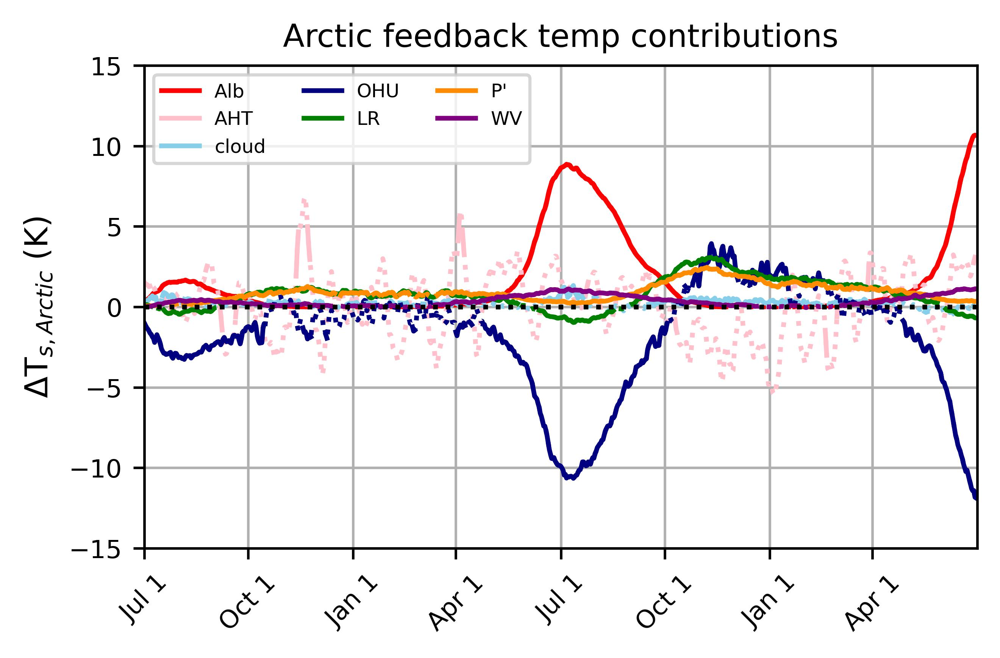

In [59]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,92,184,274])
x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jul 1','Oct 1','Jan 1','Apr 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_amean, color='red',linestyle='dotted')
ax.plot(xs, alb_amean.where(alb_p_a<0.05), color='red',label='Alb')
ax.plot(xs, AHT_amean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_amean.where(AHT_p_a<0.05), color='pink',label='AHT')
ax.plot(xs, cld_amean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_amean.where(cld_p_a<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_amean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_amean.where(dEdt_p_g<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_amean, color='green',linestyle='dotted')
ax.plot(xs, lap_amean.where(lap_p_a<0.05), color='green',label='LR')
ax.plot(xs, plk_amean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_amean.where(plk_p_a<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_amean, color='purple',linestyle='dotted')
ax.plot(xs, q_amean.where(q_p_a<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_g,color='gray',label='CO$_2$')
ax.set_xlim([1,731])
ax.set_ylim([-15,15])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=6,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic feedback temp contributions',fontsize=10)
plt.tight_layout()
plt.show()

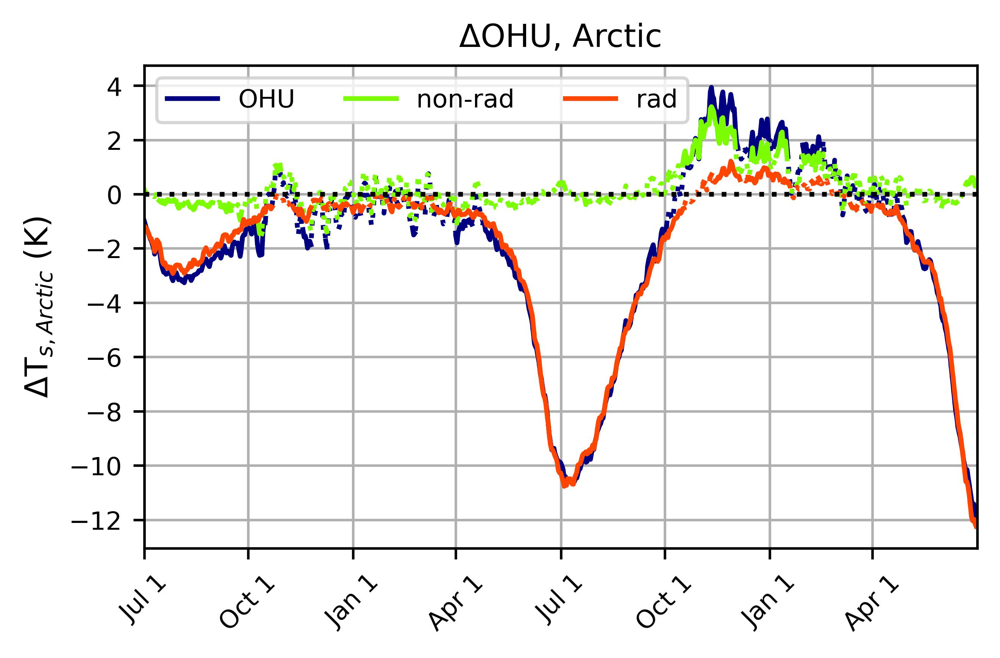

In [58]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,92,184,274])
x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jul 1','Oct 1','Jan 1','Apr 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_amean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_amean.where(nonrad_p_a<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_amean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_amean.where(rad_p_a<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, Arctic',fontsize=10)
plt.tight_layout()
plt.show()

### Arctic - global

In [60]:
AHT_diff = (AHT_a - AHT_g)/norm
AHT_mean = AHT_diff.mean(dim='ens').rolling(time=15,min_periods=1).mean()
AHT_p = stats.ttest_1samp(AHT_diff,0,axis=0)[1]

alb_diff = (alb_a - alb_g)/norm
alb_mean = alb_diff.mean(dim='ens')
alb_p = stats.ttest_1samp(alb_diff,0,axis=0)[1]

cld_diff = (cld_a - cld_g)/norm
cld_mean = cld_diff.mean(dim='ens')
cld_p = stats.ttest_1samp(cld_diff,0,axis=0)[1]

dEdt_diff = (dEdt_a - dEdt_g)/norm
dEdt_mean = dEdt_diff.mean(dim='ens').rolling(time=15,min_periods=1).mean()
dEdt_p = stats.ttest_1samp(dEdt_diff,0,axis=0)[1]

sfc_diff = (sfc_a - sfc_g)/norm
sfc_mean = sfc_diff.mean(dim='ens')
sfc_p = stats.ttest_1samp(sfc_diff,0,axis=0)[1]

lap_diff = (lap_a - lap_g)/norm
lap_mean = lap_diff.mean(dim='ens')
lap_p = stats.ttest_1samp(lap_diff,0,axis=0)[1]

plk_diff = (plk_aprime - plk_gprime)/norm
plk_mean = plk_diff.mean(dim='ens')
plk_p = stats.ttest_1samp(plk_diff,0,axis=0)[1]

q_diff = (q_a - q_g)/norm
q_mean = q_diff.mean(dim='ens')
q_p = stats.ttest_1samp(q_diff,0,axis=0)[1]

nonrad_diff = (nonrad_a - nonrad_g)/norm
nonrad_mean = nonrad_diff.mean(dim='ens')
nonrad_p = stats.ttest_1samp(nonrad_diff,0,axis=0)[1]

rad_diff = (rad_a - rad_g)/norm
rad_mean = rad_diff.mean(dim='ens')
rad_p = stats.ttest_1samp(rad_diff,0,axis=0)[1]

# CO2_diff = np.array(co2_a - co2_g)/np.array(norm)

sat_diff_all = (sat_a_all - sat_g_all)
sat_mean_all = sat_diff_all.mean(dim='ens')
sat_p_all = stats.ttest_1samp(sat_diff_all,0,axis=0)[1]

q_strato_diff = (q_strato_a - q_strato_g)/norm
q_strato_mean = q_strato_diff.mean(dim='ens')
q_strato_p = stats.ttest_1samp(q_strato_diff,0,axis=0)[1]

T_strato_diff = (T_strato_a - T_strato_g)/norm
T_strato_mean = T_strato_diff.mean(dim='ens')
T_strato_p = stats.ttest_1samp(T_strato_diff,0,axis=0)[1]

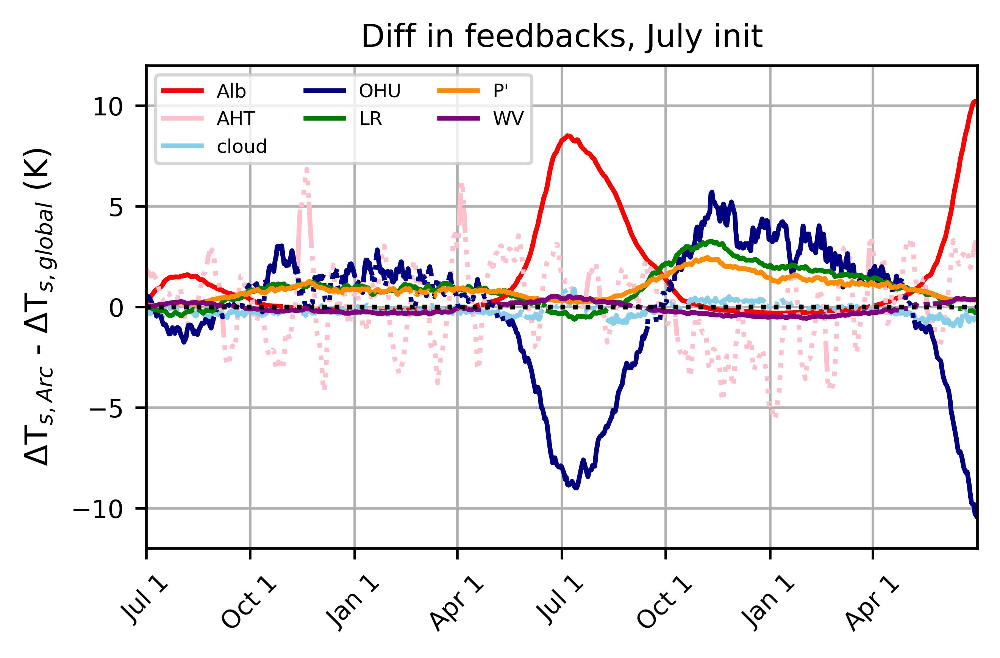

In [63]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,92,184,274])
x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jul 1','Oct 1','Jan 1','Apr 1'],
                 (2))

# plot 4xCO2 starting in Jul
ax.plot(xs, alb_mean, color='red',linestyle='dotted')
ax.plot(xs, alb_mean.where(alb_p<0.05), color='red',label='Alb')
ax.plot(xs, AHT_mean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_mean.where(AHT_p<0.05), color='pink',label='AHT')
ax.plot(xs, cld_mean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_mean.where(cld_p<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_mean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_mean.where(dEdt_p<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_mean, color='green',linestyle='dotted')
ax.plot(xs, lap_mean.where(lap_p<0.05), color='green',label='LR')
ax.plot(xs, plk_mean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_mean.where(plk_p<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_mean.where(q_p<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_diff,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])
ax.set_ylim([-12,12])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arc}$ - ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=6,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Diff in feedbacks, July init',fontsize=10)
plt.tight_layout()
plt.show()

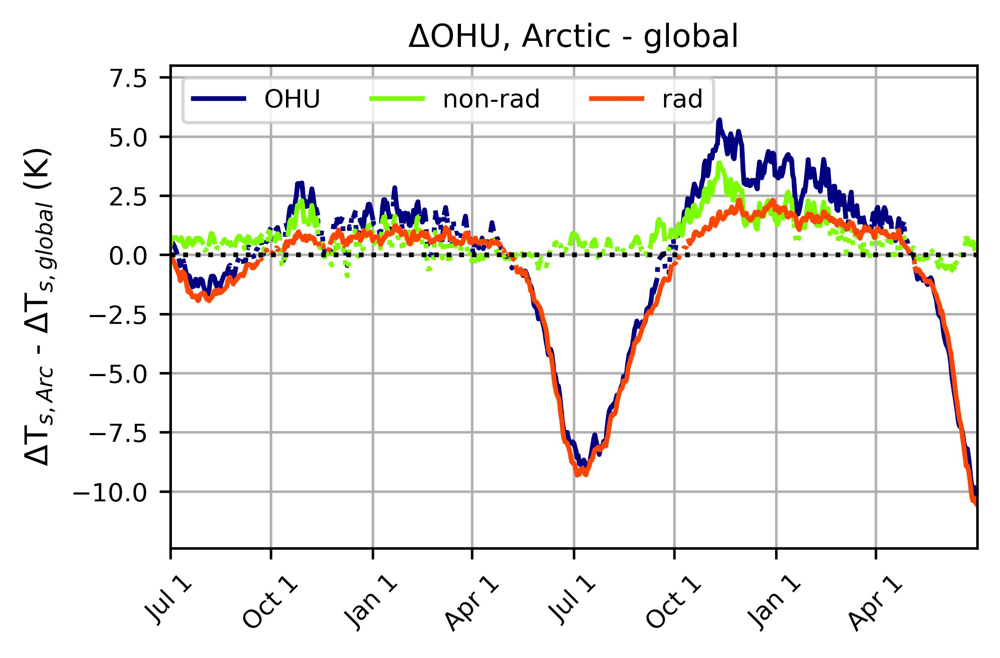

In [64]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,92,184,274])
x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jul 1','Oct 1','Jan 1','Apr 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_mean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_mean.where(nonrad_p<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_mean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_mean.where(rad_p<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
ax.set_ylim([-12.4,8])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arc}$ - ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, Arctic - global',fontsize=10)
plt.tight_layout()
plt.show()

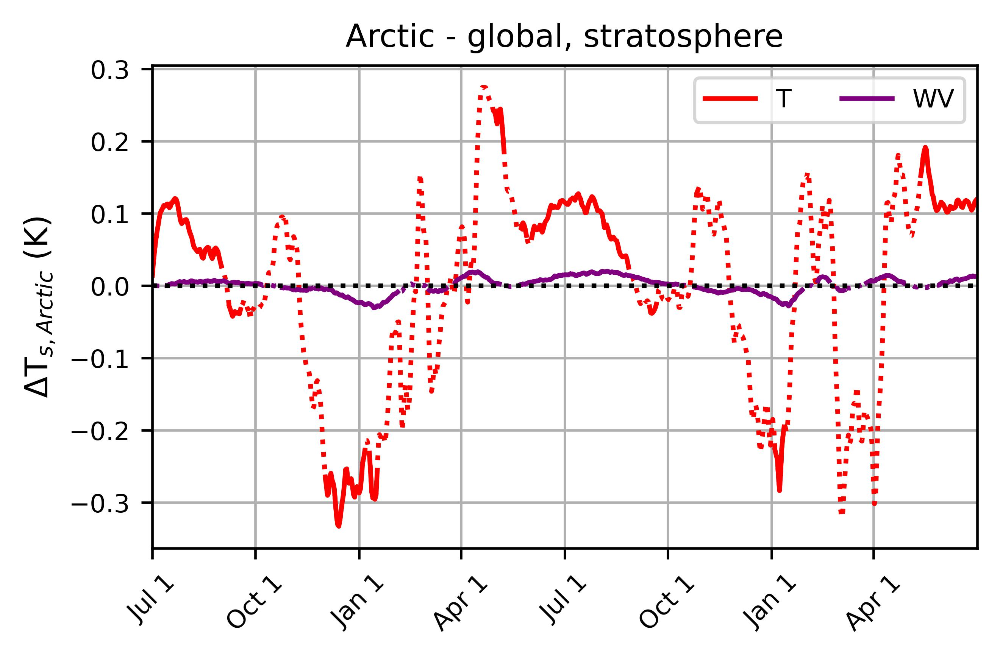

In [65]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,92,184,274])
x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jul 1','Oct 1','Jan 1','Apr 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_mean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_mean.where(T_strato_p < 0.05), color='red',label='T')
ax.plot(xs, q_strato_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_mean.where(q_strato_p<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic - global, stratosphere',fontsize=10)
plt.tight_layout()
plt.show()

## Land only

### Jan init

In [72]:
# all files have the same path
path = '/dx02/janoski/cesm/spat_avg_feedbacks/all/b40.1850.cam5-lens.01.'

# read in each dataarray, _g = global average, _a = arctic average (>70N)
AHT_g = xr.open_dataarray(path+'glb_AHT.nc')
alb_g = xr.open_dataarray(path+'glb_alb_toa.nc')
clw_g = xr.open_dataarray(path+'glb_clw_toa.nc')
# co2_g = xr.open_dataarray(path+'glb_CO2.nc')
csw_g = xr.open_dataarray(path+'glb_csw_toa.nc')
dEdt_g = xr.open_dataarray(path+'glb_dEdt.nc')
dTS_g = xr.open_dataarray(path+'glb_dTS.nc')
sfc_g = xr.open_dataarray(path+'glb_Fsfc.nc')
lap_g = xr.open_dataarray(path+'glb_lapse.nc')
plk_g = xr.open_dataarray(path+'glb_planck.nc')
qlw_g = xr.open_dataarray(path+'glb_qlw_toa.nc')
qsw_g = xr.open_dataarray(path+'glb_qsw_toa.nc')
sat_g_all = xr.open_dataarray(path+'glb_dSAT.nc')
dLHFLX_g = xr.open_dataarray(path+'glb_dLHFLX.nc')
dSHFLX_g = xr.open_dataarray(path+'glb_dSHFLX.nc')
qlw_strato_g = xr.open_dataarray(path+'glb_qlw_strato.nc')
qsw_strato_g = xr.open_dataarray(path+'glb_qsw_strato.nc')
T_strato_g = xr.open_dataarray(path+'glb_T_strato.nc')

nonrad_g = dLHFLX_g + dSHFLX_g
rad_g = sfc_g - nonrad_g

# add SW and LW components of cloud and Q feedbacks
cld_g = clw_g + csw_g
q_g = qlw_g + qsw_g
q_strato_g = qlw_strato_g + qsw_strato_g

# planck is local deviation from global avg:
plk_gprime = ((plk_g / dTS_g.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_g.mean(dim='ens')

In [73]:
AHT_gmean = AHT_g.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_g = stats.ttest_1samp(AHT_g,0,axis=0)[1]

alb_gmean = alb_g.mean(dim='ens')/norm
alb_p_g = stats.ttest_1samp(alb_g,0,axis=0)[1]

cld_gmean = cld_g.mean(dim='ens')/norm
cld_p_g = stats.ttest_1samp(cld_g,0,axis=0)[1]

dEdt_gmean = dEdt_g.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
dEdt_p_g = stats.ttest_1samp(dEdt_g,0,axis=0)[1]

sfc_gmean = sfc_g.mean(dim='ens')/norm
sfc_p_g = stats.ttest_1samp(sfc_g,0,axis=0)[1]

lap_gmean = lap_g.mean(dim='ens')/norm
lap_p_g = stats.ttest_1samp(lap_g,0,axis=0)[1]

plk_gmean = plk_gprime.mean(dim='ens')/norm
plk_p_g = stats.ttest_1samp(plk_gprime,0,axis=0)[1]

q_gmean = q_g.mean(dim='ens')/norm
q_p_g = stats.ttest_1samp(q_g,0,axis=0)[1]

nonrad_gmean = nonrad_g.mean(dim='ens')/norm
nonrad_p_g = stats.ttest_1samp(nonrad_g,0,axis=0)[1]

rad_gmean = rad_g.mean(dim='ens')/norm
rad_p_g = stats.ttest_1samp(rad_g,0,axis=0)[1]

# CO2_g = np.array(co2_g)/np.array(norm)

q_strato_gmean = q_strato_g.mean(dim='ens')/norm
q_strato_p_g = stats.ttest_1samp(q_strato_g,0,axis=0)[1]
T_strato_gmean = T_strato_g.mean(dim='ens')/norm
T_strato_p_g = stats.ttest_1samp(T_strato_g,0,axis=0)[1]

In [74]:
# read in each dataarray, _g = global average, _a = arctic average (>70N)
path = '/dx02/janoski/cesm/spat_avg_feedbacks/land_only/b40.1850.cam5-lens.01.'

AHT_a = xr.open_dataarray(path+'arc_AHT.nc')
alb_a = xr.open_dataarray(path+'arc_alb_toa.nc')
clw_a = xr.open_dataarray(path+'arc_clw_toa.nc')
# co2_a = xr.open_dataarray(path+'arc_CO2.nc')
csw_a = xr.open_dataarray(path+'arc_csw_toa.nc')
dEdt_a = xr.open_dataarray(path+'arc_dEdt.nc')
dTS_a = xr.open_dataarray(path+'arc_dTS.nc')
sfc_a = xr.open_dataarray(path+'arc_Fsfc.nc')
lap_a = xr.open_dataarray(path+'arc_lapse.nc')
plk_a = xr.open_dataarray(path+'arc_planck.nc')
qlw_a = xr.open_dataarray(path+'arc_qlw_toa.nc')
qsw_a = xr.open_dataarray(path+'arc_qsw_toa.nc')
sat_a_all = xr.open_dataarray(path+'arc_dSAT.nc')
dLHFLX_a = xr.open_dataarray(path+'arc_dLHFLX.nc')
dSHFLX_a = xr.open_dataarray(path+'arc_dSHFLX.nc')
Sconv_a = xr.open_dataarray(path+'arc_Sconv.nc')
Wconv_a = xr.open_dataarray(path+'arc_Wconv.nc')
nonrad_a = dLHFLX_a + dSHFLX_a
rad_a = sfc_a - nonrad_a

qlw_strato_a = xr.open_dataarray(path+'arc_qlw_strato.nc')
qsw_strato_a = xr.open_dataarray(path+'arc_qsw_strato.nc')
T_strato_a = xr.open_dataarray(path+'arc_T_strato.nc')

# add SW and LW components of cloud and Q feedbacks
q_a = qlw_a + qsw_a
q_strato_a = qlw_strato_a + qsw_strato_a


# planck is local deviation from global avg:
plk_aprime = ((plk_a / dTS_a.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_a.mean(dim='ens')

# add SW and LW components of cloud and Q feedbacks
cld_a = clw_a + csw_a
q_a = qlw_a + qsw_a

In [75]:
AHT_amean = AHT_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_a = stats.ttest_1samp(AHT_a,0,axis=0)[1]

alb_amean = alb_a.mean(dim='ens')/norm
alb_p_a = stats.ttest_1samp(alb_a,0,axis=0)[1]

cld_amean = cld_a.mean(dim='ens')/norm
cld_p_a = stats.ttest_1samp(cld_a,0,axis=0)[1]

dEdt_amean = dEdt_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
dEdt_p_a = stats.ttest_1samp(dEdt_a,0,axis=0)[1]

sfc_amean = sfc_a.mean(dim='ens')/norm
sfc_p_a = stats.ttest_1samp(sfc_a,0,axis=0)[1]

lap_amean = lap_a.mean(dim='ens')/norm
lap_p_a = stats.ttest_1samp(lap_a,0,axis=0)[1]

plk_amean = plk_aprime.mean(dim='ens')/norm
plk_p_a = stats.ttest_1samp(plk_aprime,0,axis=0)[1]

q_amean = q_a.mean(dim='ens')/norm
q_p_a = stats.ttest_1samp(q_a,0,axis=0)[1]

nonrad_amean = nonrad_a.mean(dim='ens')/norm
nonrad_p_a = stats.ttest_1samp(nonrad_a,0,axis=0)[1]

rad_amean = rad_a.mean(dim='ens')/norm
rad_p_a = stats.ttest_1samp(rad_a,0,axis=0)[1]

Sconv_amean = Sconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Sconv_p_a = stats.ttest_1samp(Sconv_a,0,axis=0)[1]

Wconv_amean = Wconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Wconv_p_a = stats.ttest_1samp(Wconv_a,0,axis=0)[1]

# CO2_a = np.array(co2_a)/np.array(norm)

q_strato_amean = q_strato_a.mean(dim='ens')/norm
q_strato_p_a = stats.ttest_1samp(q_strato_a,0,axis=0)[1]
T_strato_amean = T_strato_a.mean(dim='ens')/norm
T_strato_p_a = stats.ttest_1samp(T_strato_a,0,axis=0)[1]

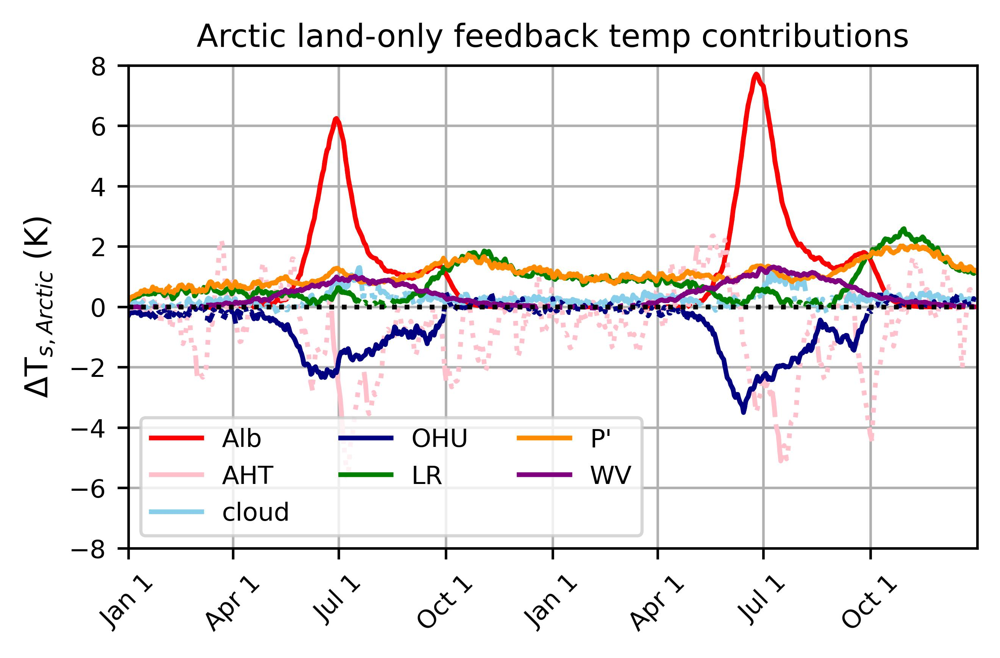

In [76]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_amean, color='red',linestyle='dotted')
ax.plot(xs, alb_amean.where(alb_p_a<0.05), color='red',label='Alb')
ax.plot(xs, AHT_amean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_amean.where(AHT_p_a<0.05), color='pink',label='AHT')
ax.plot(xs, cld_amean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_amean.where(cld_p_a<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_amean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_amean.where(dEdt_p_a<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_amean, color='green',linestyle='dotted')
ax.plot(xs, lap_amean.where(lap_p_a<0.05), color='green',label='LR')
ax.plot(xs, plk_amean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_amean.where(plk_p_a<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_amean, color='purple',linestyle='dotted')
ax.plot(xs, q_amean.where(q_p_a<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_a,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])
ax.set_ylim([-8,8])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic land-only feedback temp contributions',fontsize=10)
plt.tight_layout()
plt.show()

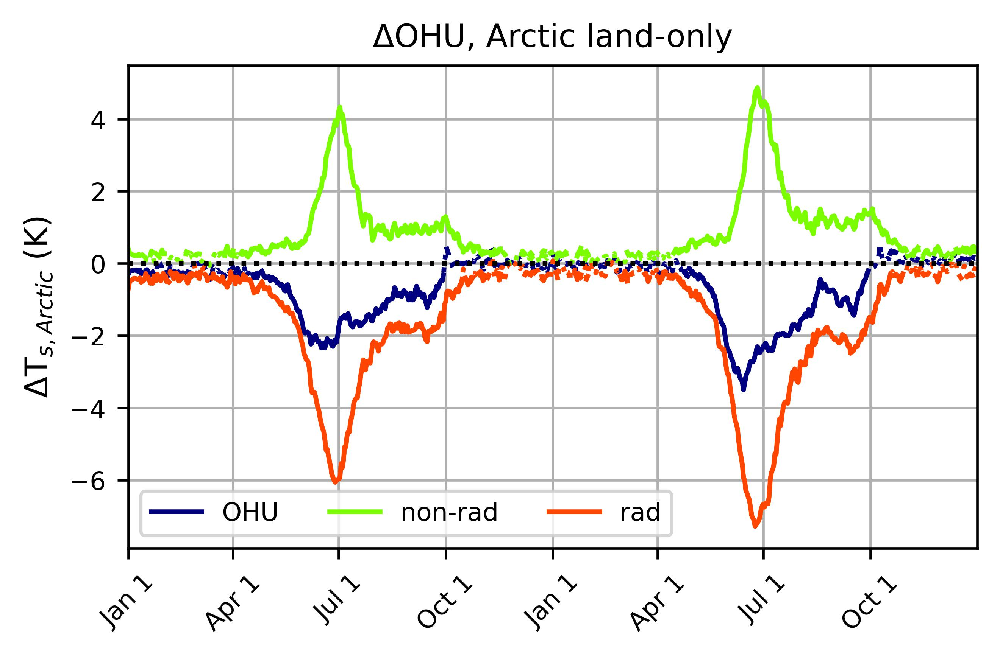

In [77]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_amean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_amean.where(nonrad_p_a<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_amean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_amean.where(rad_p_a<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, Arctic land-only',fontsize=10)
plt.tight_layout()
plt.show()

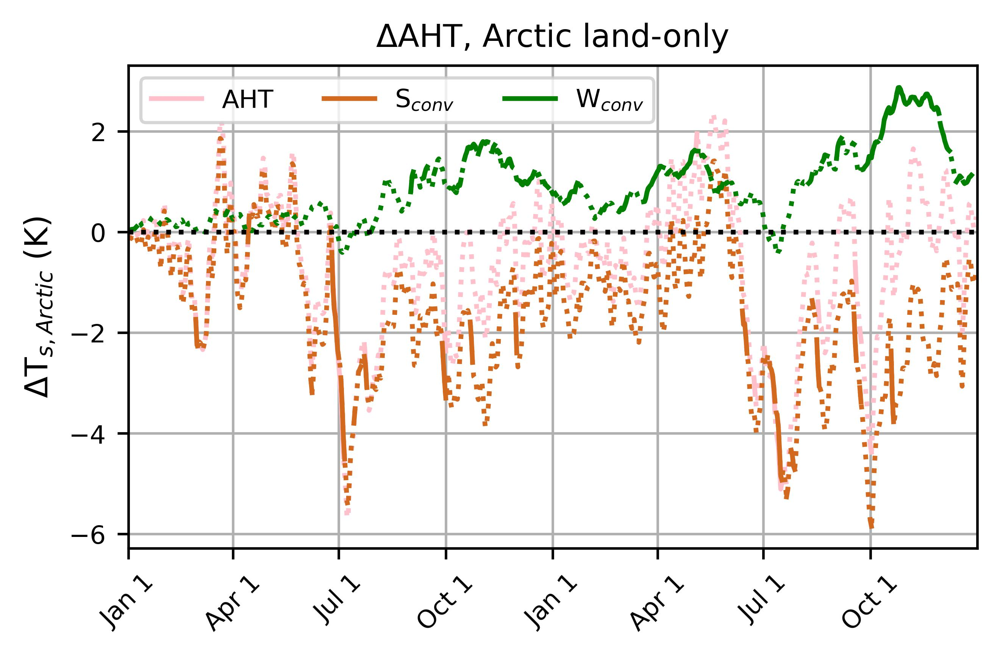

In [81]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, AHT_amean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_amean.where(AHT_p_a<0.05), color='pink',label='AHT')
ax.plot(xs, Sconv_amean, color='chocolate',linestyle='dotted')
ax.plot(xs, Sconv_amean.where(Sconv_p_a<0.05), color='chocolate',label=r'S$_{conv}$')
ax.plot(xs, Wconv_amean, color='green',linestyle='dotted')
ax.plot(xs, Wconv_amean.where(Wconv_p_a<0.05), color='green',label=r'W$_{conv}$')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔAHT, Arctic land-only',fontsize=10)
plt.tight_layout()
plt.show()

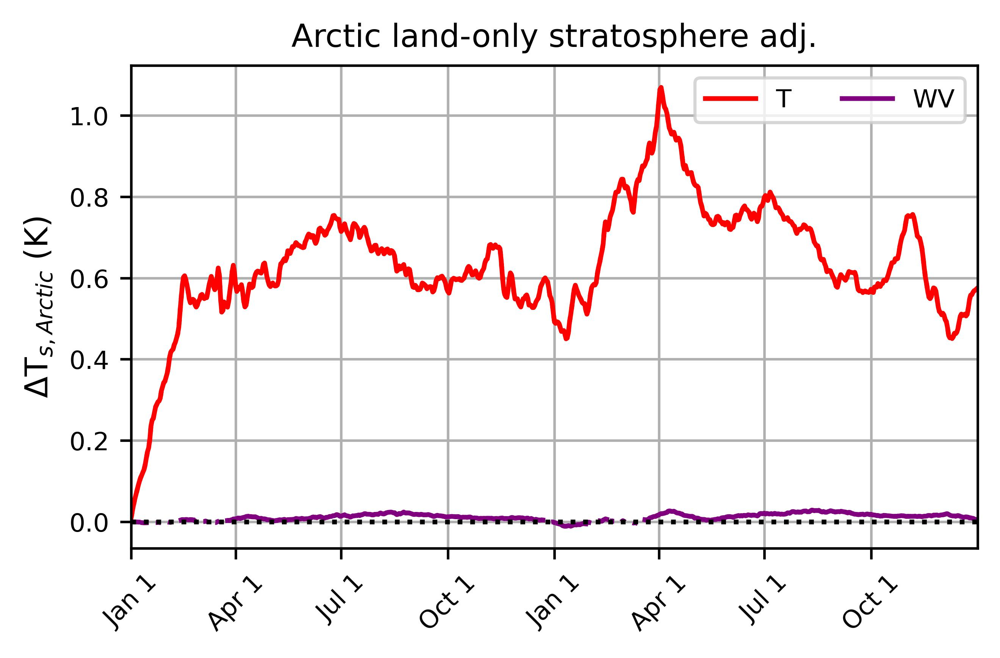

In [83]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_amean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_amean.where(T_strato_p_a<0.05),color='red',label='T')
ax.plot(xs, q_strato_amean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_amean.where(q_strato_p_a<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic land-only stratosphere adj.',fontsize=10)
plt.tight_layout()
plt.show()

In [84]:
alb_diff = (alb_a - alb_g)/norm
alb_mean = alb_diff.mean(dim='ens')
alb_p = stats.ttest_1samp(alb_diff,0,axis=0)[1]

cld_diff = (cld_a - cld_g)/norm
cld_mean = cld_diff.mean(dim='ens')
cld_p = stats.ttest_1samp(cld_diff,0,axis=0)[1]

sfc_diff = (sfc_a - sfc_g)/norm
sfc_mean = sfc_diff.mean(dim='ens')
sfc_p = stats.ttest_1samp(sfc_diff,0,axis=0)[1]

lap_diff = (lap_a - lap_g)/norm
lap_mean = lap_diff.mean(dim='ens')
lap_p = stats.ttest_1samp(lap_diff,0,axis=0)[1]

plk_diff = (plk_aprime - plk_gprime)/norm
plk_mean = plk_diff.mean(dim='ens')
plk_p = stats.ttest_1samp(plk_diff,0,axis=0)[1]

q_diff = (q_a - q_g)/norm
q_mean = q_diff.mean(dim='ens')
q_p = stats.ttest_1samp(q_diff,0,axis=0)[1]

nonrad_diff = (nonrad_a - nonrad_g)/norm
nonrad_mean = nonrad_diff.mean(dim='ens')
nonrad_p = stats.ttest_1samp(nonrad_diff,0,axis=0)[1]

rad_diff = (rad_a - rad_g)/norm
rad_mean = rad_diff.mean(dim='ens')
rad_p = stats.ttest_1samp(rad_diff,0,axis=0)[1]

# CO2_diff = np.array((co2_a - co2_g))/np.array(norm)

sat_diff_all = (sat_a_all - sat_g_all)
sat_mean_all = sat_diff_all.mean(dim='ens')
sat_p_all = stats.ttest_1samp(sat_diff_all,0,axis=0)[1]

q_strato_diff = (q_strato_a - q_strato_g)/norm
q_strato_mean = q_strato_diff.mean(dim='ens')
q_strato_p = stats.ttest_1samp(q_strato_diff,0,axis=0)[1]

T_strato_diff = (T_strato_a - T_strato_g)/norm
T_strato_mean = T_strato_diff.mean(dim='ens')
T_strato_p = stats.ttest_1samp(T_strato_diff,0,axis=0)[1]

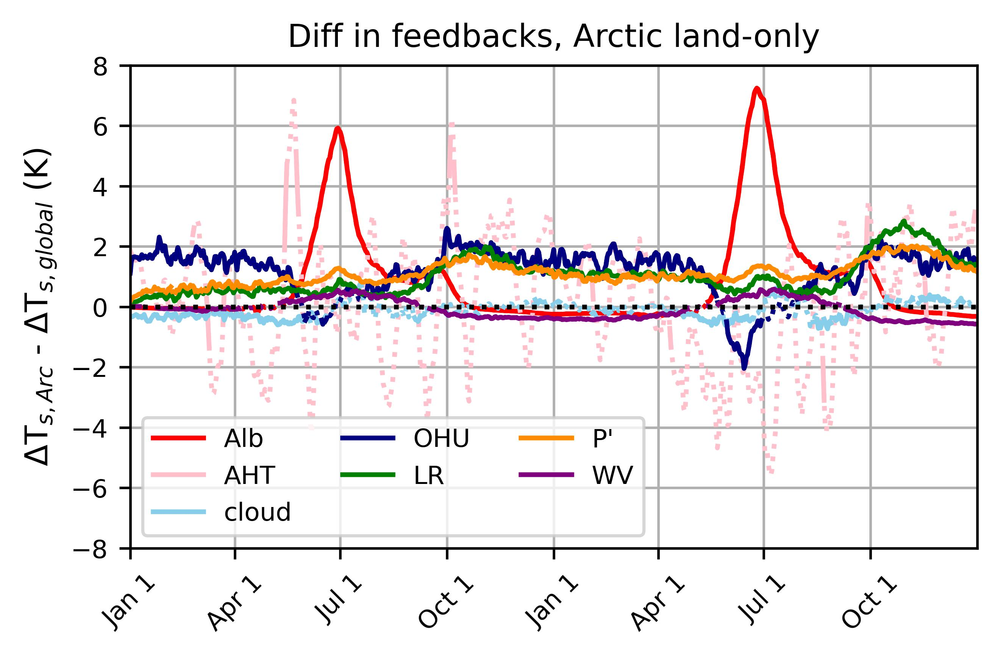

In [86]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_mean, color='red',linestyle='dotted')
ax.plot(xs, alb_mean.where(alb_p<0.05), color='red',label='Alb')
ax.plot(xs, AHT_mean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_mean.where(AHT_p<0.05), color='pink',label='AHT')
ax.plot(xs, cld_mean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_mean.where(cld_p<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_mean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_mean.where(dEdt_p<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_mean, color='green',linestyle='dotted')
ax.plot(xs, lap_mean.where(lap_p<0.05), color='green',label='LR')
ax.plot(xs, plk_mean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_mean.where(plk_p<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_mean.where(q_p<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_diff,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])
ax.set_ylim([-8,8])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arc}$ - ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Diff in feedbacks, Arctic land-only',fontsize=10)
plt.tight_layout()
plt.show()

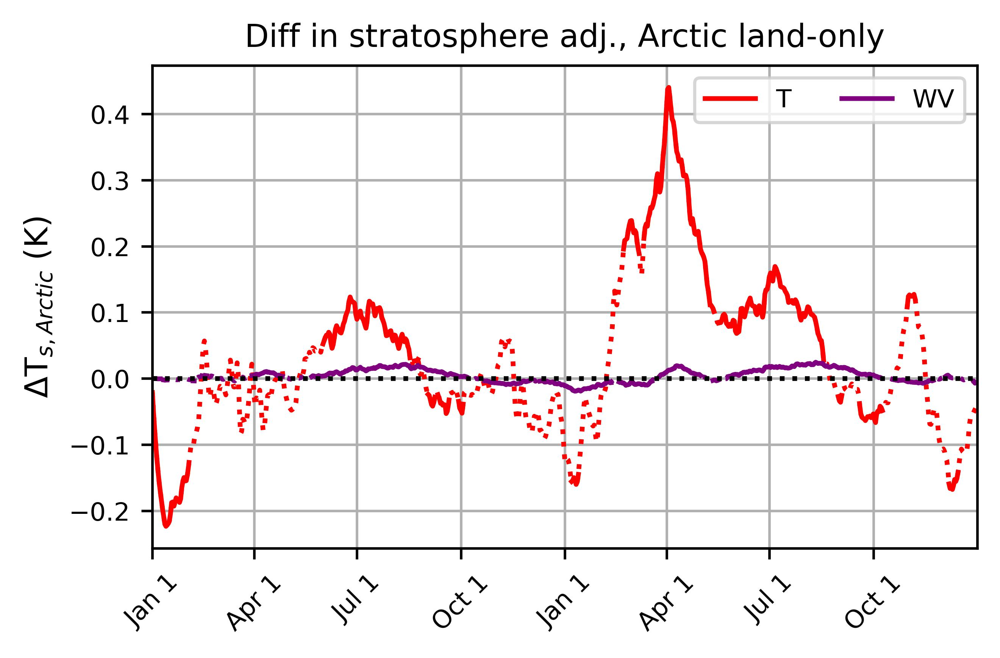

In [88]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_mean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_mean.where(T_strato_p < 0.05), color='red',label='T')
ax.plot(xs, q_strato_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_mean.where(q_strato_p<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Diff in stratosphere adj., Arctic land-only',fontsize=10)
plt.tight_layout()
plt.show()

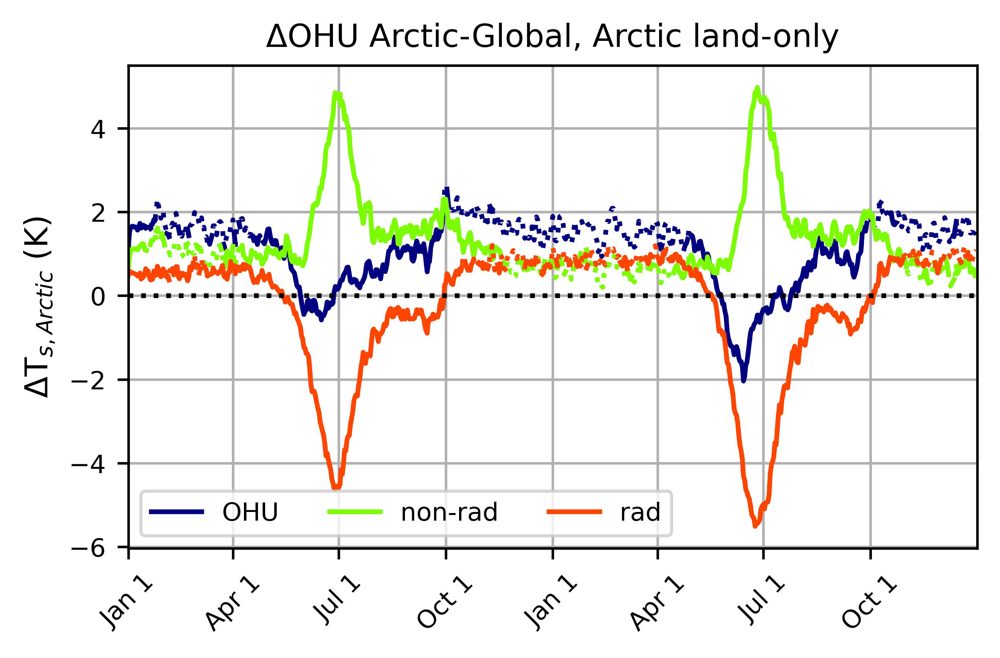

In [89]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p_a<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_mean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_mean.where(nonrad_p_a<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_mean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_mean.where(rad_p_a<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU Arctic-Global, Arctic land-only',fontsize=10)
plt.tight_layout()
plt.show()

## Ocean-only

In [90]:
# read in each dataarray, _g = global average, _a = arctic average (>70N)
path = '/dx02/janoski/cesm/spat_avg_feedbacks/ocean_only/b40.1850.cam5-lens.01.'

AHT_a = xr.open_dataarray(path+'arc_AHT.nc')
alb_a = xr.open_dataarray(path+'arc_alb_toa.nc')
clw_a = xr.open_dataarray(path+'arc_clw_toa.nc')
# co2_a = xr.open_dataarray(path+'arc_CO2.nc')
csw_a = xr.open_dataarray(path+'arc_csw_toa.nc')
dEdt_a = xr.open_dataarray(path+'arc_dEdt.nc')
dTS_a = xr.open_dataarray(path+'arc_dTS.nc')
sfc_a = xr.open_dataarray(path+'arc_Fsfc.nc')
lap_a = xr.open_dataarray(path+'arc_lapse.nc')
plk_a = xr.open_dataarray(path+'arc_planck.nc')
qlw_a = xr.open_dataarray(path+'arc_qlw_toa.nc')
qsw_a = xr.open_dataarray(path+'arc_qsw_toa.nc')
sat_a_all = xr.open_dataarray(path+'arc_dSAT.nc')
dLHFLX_a = xr.open_dataarray(path+'arc_dLHFLX.nc')
dSHFLX_a = xr.open_dataarray(path+'arc_dSHFLX.nc')
Sconv_a = xr.open_dataarray(path+'arc_Sconv.nc')
Wconv_a = xr.open_dataarray(path+'arc_Wconv.nc')
nonrad_a = dLHFLX_a + dSHFLX_a
rad_a = sfc_a - nonrad_a

qlw_strato_a = xr.open_dataarray(path+'arc_qlw_strato.nc')
qsw_strato_a = xr.open_dataarray(path+'arc_qsw_strato.nc')
T_strato_a = xr.open_dataarray(path+'arc_T_strato.nc')

# add SW and LW components of cloud and Q feedbacks
q_a = qlw_a + qsw_a
q_strato_a = qlw_strato_a + qsw_strato_a


# planck is local deviation from global avg:
plk_aprime = ((plk_a / dTS_a.mean(dim='ens')) -
         (plk_g / dTS_g.mean(dim='ens'))) * dTS_a.mean(dim='ens')

# add SW and LW components of cloud and Q feedbacks
cld_a = clw_a + csw_a
q_a = qlw_a + qsw_a

In [91]:
AHT_amean = AHT_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
AHT_p_a = stats.ttest_1samp(AHT_a,0,axis=0)[1]

alb_amean = alb_a.mean(dim='ens')/norm
alb_p_a = stats.ttest_1samp(alb_a,0,axis=0)[1]

cld_amean = cld_a.mean(dim='ens')/norm
cld_p_a = stats.ttest_1samp(cld_a,0,axis=0)[1]

dEdt_amean = dEdt_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
dEdt_p_a = stats.ttest_1samp(dEdt_a,0,axis=0)[1]

sfc_amean = sfc_a.mean(dim='ens')/norm
sfc_p_a = stats.ttest_1samp(sfc_a,0,axis=0)[1]

lap_amean = lap_a.mean(dim='ens')/norm
lap_p_a = stats.ttest_1samp(lap_a,0,axis=0)[1]

plk_amean = plk_aprime.mean(dim='ens')/norm
plk_p_a = stats.ttest_1samp(plk_aprime,0,axis=0)[1]

q_amean = q_a.mean(dim='ens')/norm
q_p_a = stats.ttest_1samp(q_a,0,axis=0)[1]

nonrad_amean = nonrad_a.mean(dim='ens')/norm
nonrad_p_a = stats.ttest_1samp(nonrad_a,0,axis=0)[1]

rad_amean = rad_a.mean(dim='ens')/norm
rad_p_a = stats.ttest_1samp(rad_a,0,axis=0)[1]

Sconv_amean = Sconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Sconv_p_a = stats.ttest_1samp(Sconv_a,0,axis=0)[1]

Wconv_amean = Wconv_a.mean(dim='ens').rolling(time=15,min_periods=1).mean()/norm
Wconv_p_a = stats.ttest_1samp(Wconv_a,0,axis=0)[1]

CO2_a = np.array(co2_a)/np.array(norm)

q_strato_amean = q_strato_a.mean(dim='ens')/norm
q_strato_p_a = stats.ttest_1samp(q_strato_a,0,axis=0)[1]
T_strato_amean = T_strato_a.mean(dim='ens')/norm
T_strato_p_a = stats.ttest_1samp(T_strato_a,0,axis=0)[1]

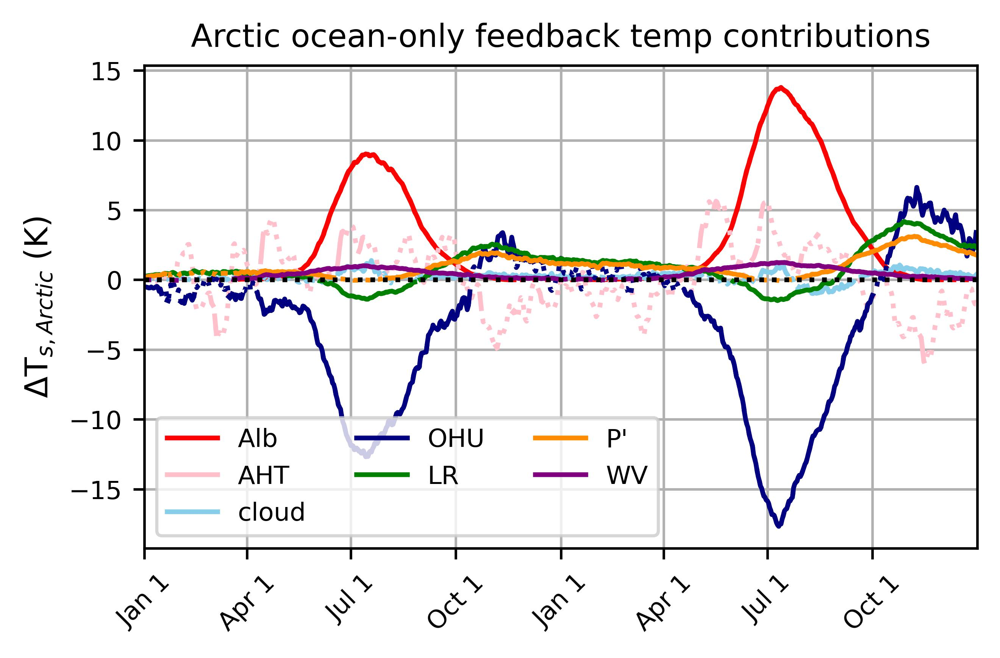

In [92]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_amean, color='red',linestyle='dotted')
ax.plot(xs, alb_amean.where(alb_p_a<0.05), color='red',label='Alb')
ax.plot(xs, AHT_amean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_amean.where(AHT_p_a<0.05), color='pink',label='AHT')
ax.plot(xs, cld_amean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_amean.where(cld_p_a<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_amean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_amean.where(dEdt_p_a<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_amean, color='green',linestyle='dotted')
ax.plot(xs, lap_amean.where(lap_p_a<0.05), color='green',label='LR')
ax.plot(xs, plk_amean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_amean.where(plk_p_a<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_amean, color='purple',linestyle='dotted')
ax.plot(xs, q_amean.where(q_p_a<0.05), color='purple',label=r'WV')
# ax.plot(xs, CO2_a,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic ocean-only feedback temp contributions',fontsize=10)
plt.tight_layout()
plt.show()

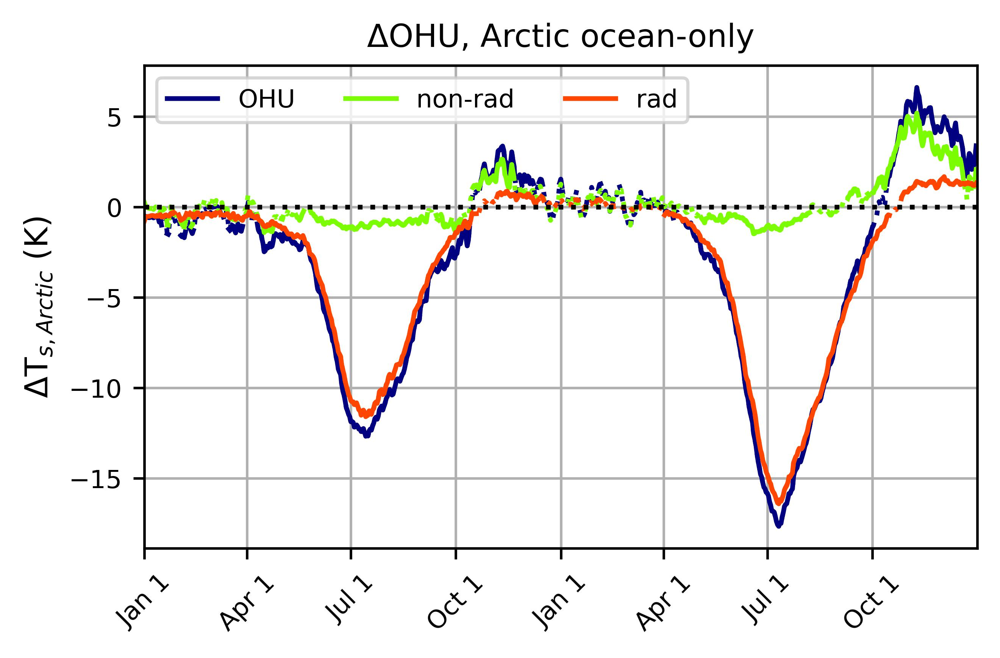

In [93]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_amean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_amean.where(sfc_p_a<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_amean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_amean.where(nonrad_p_a<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_amean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_amean.where(rad_p_a<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU, Arctic ocean-only',fontsize=10)
plt.tight_layout()
plt.show()

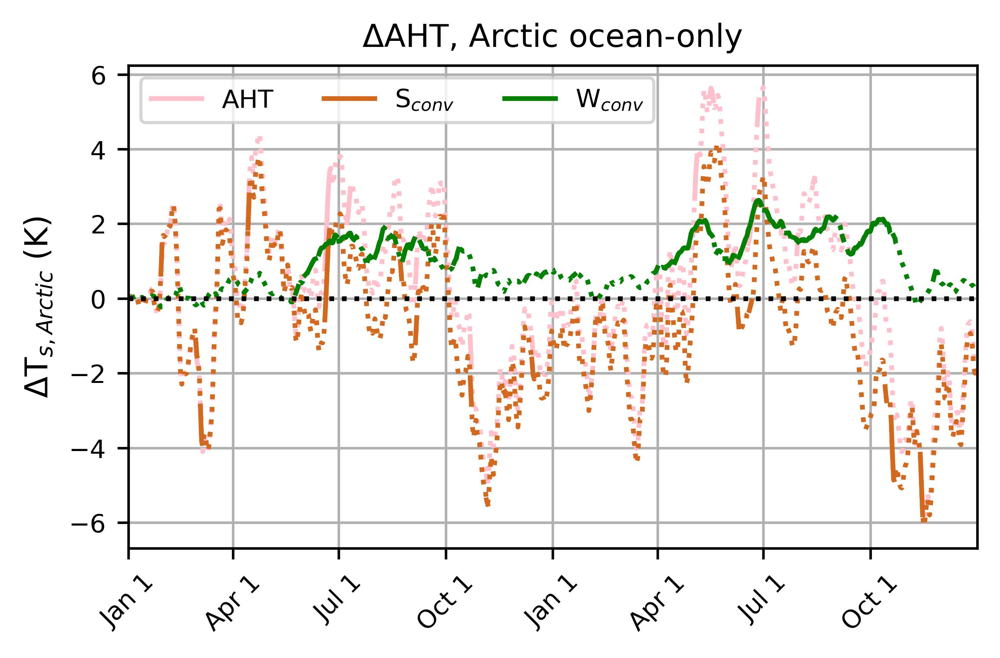

In [95]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, AHT_amean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_amean.where(AHT_p_a<0.05), color='pink',label='AHT')
ax.plot(xs, Sconv_amean, color='chocolate',linestyle='dotted')
ax.plot(xs, Sconv_amean.where(Sconv_p_a<0.05), color='chocolate',label=r'S$_{conv}$')
ax.plot(xs, Wconv_amean, color='green',linestyle='dotted')
ax.plot(xs, Wconv_amean.where(Wconv_p_a<0.05), color='green',label=r'W$_{conv}$')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔAHT, Arctic ocean-only',fontsize=10)
plt.tight_layout()
plt.show()

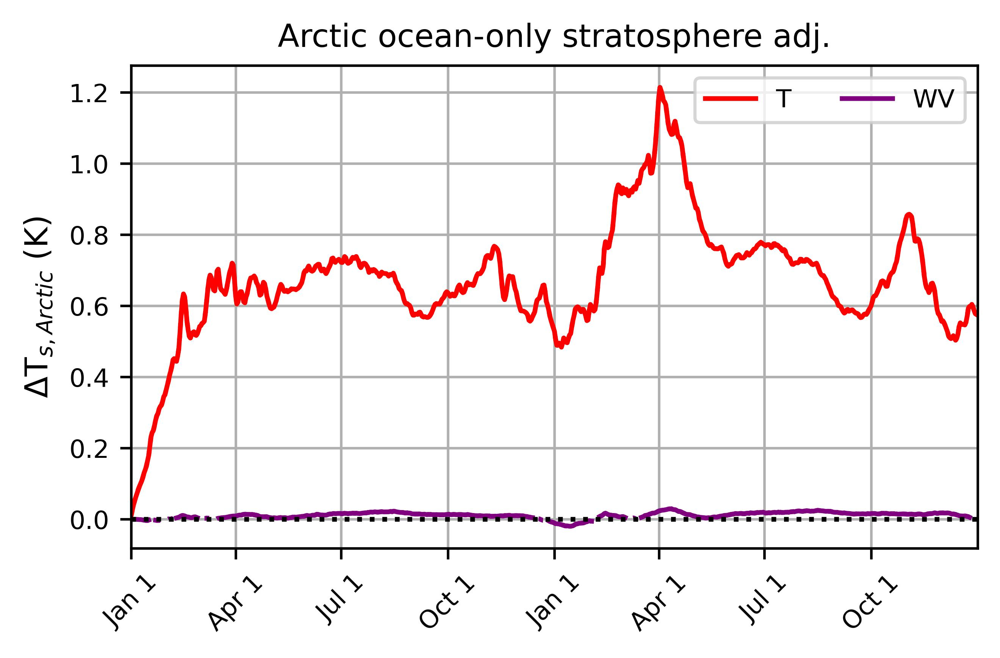

In [97]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_amean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_amean.where(T_strato_p_a<0.05),color='red',label='T')
ax.plot(xs, q_strato_amean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_amean.where(q_strato_p_a<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Arctic ocean-only stratosphere adj.',fontsize=10)
plt.tight_layout()
plt.show()

In [99]:
alb_diff = (alb_a - alb_g)/norm
alb_mean = alb_diff.mean(dim='ens')
alb_p = stats.ttest_1samp(alb_diff,0,axis=0)[1]

cld_diff = (cld_a - cld_g)/norm
cld_mean = cld_diff.mean(dim='ens')
cld_p = stats.ttest_1samp(cld_diff,0,axis=0)[1]

sfc_diff = (sfc_a - sfc_g)/norm
sfc_mean = sfc_diff.mean(dim='ens')
sfc_p = stats.ttest_1samp(sfc_diff,0,axis=0)[1]

lap_diff = (lap_a - lap_g)/norm
lap_mean = lap_diff.mean(dim='ens')
lap_p = stats.ttest_1samp(lap_diff,0,axis=0)[1]

plk_diff = (plk_aprime - plk_gprime)/norm
plk_mean = plk_diff.mean(dim='ens')
plk_p = stats.ttest_1samp(plk_diff,0,axis=0)[1]

q_diff = (q_a - q_g)/norm
q_mean = q_diff.mean(dim='ens')
q_p = stats.ttest_1samp(q_diff,0,axis=0)[1]

nonrad_diff = (nonrad_a - nonrad_g)/norm
nonrad_mean = nonrad_diff.mean(dim='ens')
nonrad_p = stats.ttest_1samp(nonrad_diff,0,axis=0)[1]

rad_diff = (rad_a - rad_g)/norm
rad_mean = rad_diff.mean(dim='ens')
rad_p = stats.ttest_1samp(rad_diff,0,axis=0)[1]

# CO2_diff = np.array((co2_a - co2_g))/np.array(norm)

sat_diff_all = (sat_a_all - sat_g_all)
sat_mean_all = sat_diff_all.mean(dim='ens')
sat_p_all = stats.ttest_1samp(sat_diff_all,0,axis=0)[1]

q_strato_diff = (q_strato_a - q_strato_g)/norm
q_strato_mean = q_strato_diff.mean(dim='ens')
q_strato_p = stats.ttest_1samp(q_strato_diff,0,axis=0)[1]

T_strato_diff = (T_strato_a - T_strato_g)/norm
T_strato_mean = T_strato_diff.mean(dim='ens')
T_strato_p = stats.ttest_1samp(T_strato_diff,0,axis=0)[1]

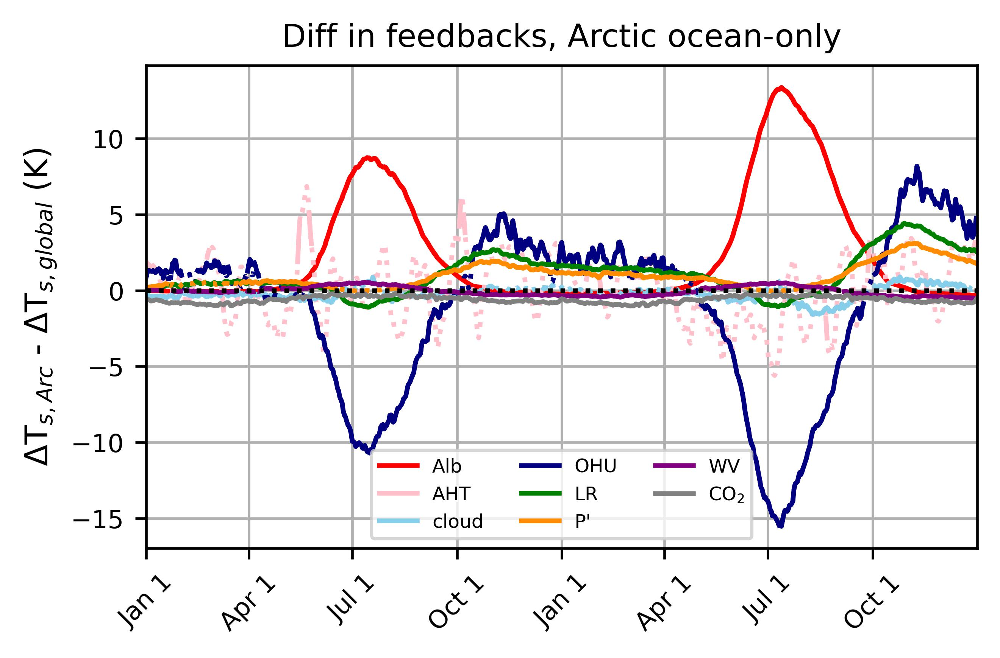

In [101]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, alb_mean, color='red',linestyle='dotted')
ax.plot(xs, alb_mean.where(alb_p<0.05), color='red',label='Alb')
ax.plot(xs, AHT_mean, color='pink',linestyle='dotted')
ax.plot(xs, AHT_mean.where(AHT_p<0.05), color='pink',label='AHT')
ax.plot(xs, cld_mean, color='skyblue',linestyle='dotted')
ax.plot(xs, cld_mean.where(cld_p<0.05), color='skyblue',label='cloud')
# ax.plot(xs, dEdt_mean, color='coral',linestyle='dotted')
# ax.plot(xs, dEdt_mean.where(dEdt_p<0.05), color='coral',label='dE/dt')
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p<0.05), color='navy',label=r'OHU')
ax.plot(xs, lap_mean, color='green',linestyle='dotted')
ax.plot(xs, lap_mean.where(lap_p<0.05), color='green',label='LR')
ax.plot(xs, plk_mean, color='darkorange',linestyle='dotted')
ax.plot(xs, plk_mean.where(plk_p<0.05), color='darkorange',label='P\'')
ax.plot(xs, q_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_mean.where(q_p<0.05), color='purple',label=r'WV')
ax.plot(xs, CO2_diff,color='gray',label='CO$_2$')
# ax.plot(xs, lr_diff, color='green',label='LR')
# ax.plot(xs, plk_a_norm, color='darkorange',label='Planck')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arc}$ - ΔT$_{s,global}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=6,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Diff in feedbacks, Arctic ocean-only',fontsize=10)
plt.tight_layout()
plt.show()

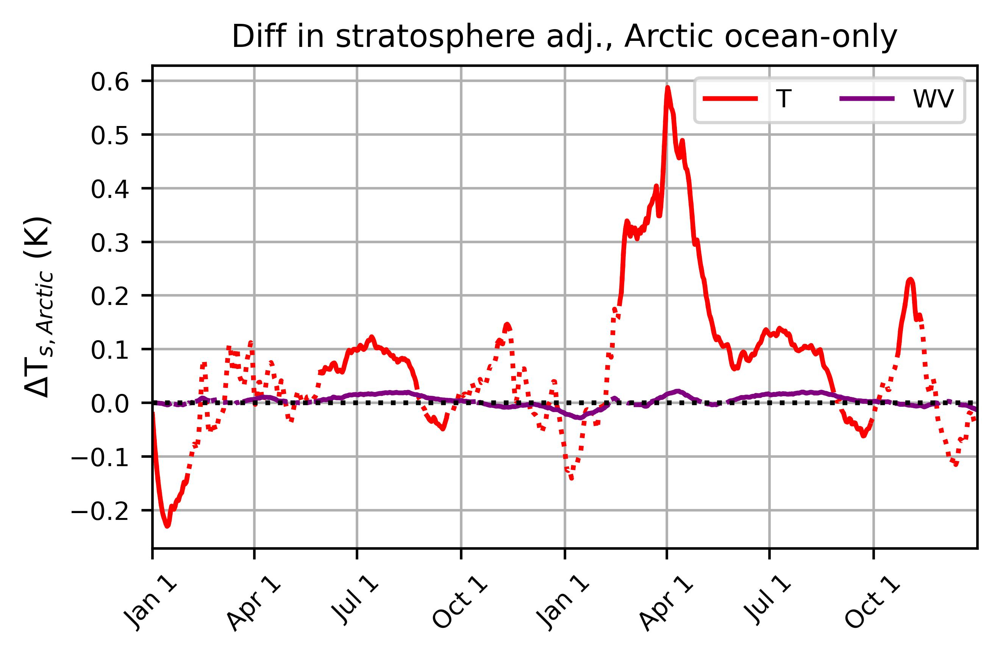

In [102]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, T_strato_mean, color='red',linestyle='dotted')
ax.plot(xs, T_strato_mean.where(T_strato_p < 0.05), color='red',label='T')
ax.plot(xs, q_strato_mean, color='purple',linestyle='dotted')
ax.plot(xs, q_strato_mean.where(q_strato_p<0.05),color='purple',label='WV')
# ax.plot(xs, lr_diff, color='green',label='LR')
# # ax[2,0].set_ylim([-3,14])
ax.set_xlim([1,731])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('Diff in stratosphere adj., Arctic ocean-only',fontsize=10)
plt.tight_layout()
plt.show()

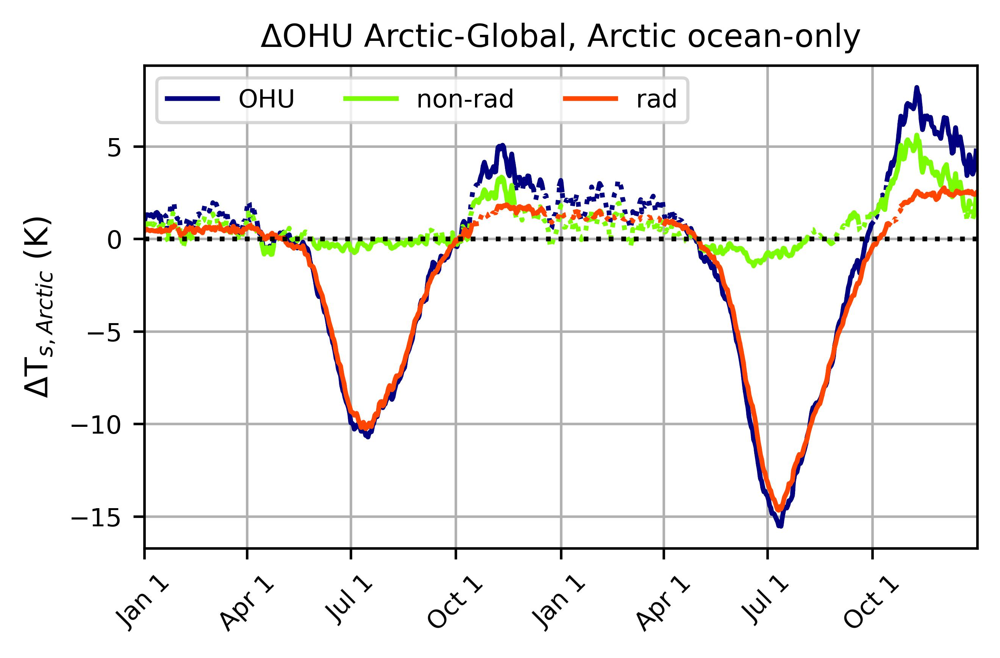

In [103]:
# create figure object
fig, ax = plt.subplots(ncols=1,figsize=(4.5,3),dpi=600)

xs = np.arange(1,731,1)

first_days = np.array([1,91,182,274])

x_vals = np.concatenate((first_days,first_days+365))
x_labs = np.tile(['Jan 1','Apr 1','Jul 1','Oct 1'],
                 (2))

# plot 4xCO2 starting in Jan
ax.plot(xs, sfc_mean, color='navy',linestyle='dotted')
ax.plot(xs, sfc_mean.where(sfc_p_a<0.05), color='navy',label='OHU')
ax.plot(xs, nonrad_mean, color='lawngreen',linestyle='dotted')
ax.plot(xs, nonrad_mean.where(nonrad_p_a<0.05), color='lawngreen',label=r'non-rad')
ax.plot(xs, rad_mean, color='orangered',linestyle='dotted')
ax.plot(xs, rad_mean.where(rad_p_a<0.05), color='orangered',label=r'rad')
ax.set_xlim([1,731])
# ax.set_ylim([-9,9])

ax.tick_params(axis='x', rotation=45,labelsize=8)
ax.tick_params(axis='y',labelsize=8)
ax.set_ylabel(r'ΔT$_{s,Arctic}$ (K)',fontsize=10)
ax.hlines(0,1,731,color='black',linestyle=':')
# ax[2,0].set_title(r'Change in SAT, 4xCO$_2$ in Jan, 30 ens. members',fontsize=10)
ax.legend(loc='best',fontsize=8,ncol=3)
ax.set_xticks(x_vals)
ax.set_xticklabels(x_labs)
ax.grid()

plt.title('ΔOHU Arctic-Global, Arctic ocean-only',fontsize=10)
plt.tight_layout()
plt.show()